# Play with pipeline

### Import

In [1]:
%load_ext autoreload
%autoreload 2

import os
PROJECT_PATH = "/projects/compures/alexandre/disdiff_adapters"
os.chdir(PROJECT_PATH)
print(os.getcwd())

import torch.nn as nn # type: ignore
from torch.utils.data import DataLoader, TensorDataset
import torchvision.utils as vutils

from PIL import Image, ImageDraw, ImageFont
from matplotlib.colors import ListedColormap, BoundaryNorm

#DataModule
from disdiff_adapters.data_module import *
#Dataset
from disdiff_adapters.dataset import *
#Module
from disdiff_adapters.arch.vae import *
from disdiff_adapters.arch.multi_distillme import *
#utils
from disdiff_adapters.utils import *
#loss   
from disdiff_adapters.loss import *
#metric
from disdiff_adapters.metric import *

from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint
from lightning.pytorch.loggers import TensorBoardLogger
from lightning import Trainer
from lightning.pytorch.strategies import DDPStrategy

from disdiff_adapters.arch.multi_distillme.multi_distillme_factors import Xfactors
BATCH_SIZE = 32
LATENT_DIM = 2

torch.set_float32_matmul_precision('medium')

/import/pr_compures/alexandre/disdiff_adapters


## Load data 

**Choose the appropriate set :**

### 3DShapes

In [2]:
#6mn30 from ens cluster
shapes = Shapes3DDataModule(batch_size=1092)
shapes.prepare_data()
shapes.setup(stage='fit')
shapes_loader = shapes.train_dataloader()
# # else :
# images, labels = load_h5(Shapes3D.Path.H5)
# images = torch.tensor(images[:10000]/255, dtype=torch.float32).permute(0,3,1,2)
# labels = labels[:10000]
# shapes_loader = DataLoader(TensorDataset(images, torch.tensor(labels)), batch_size=8, shuffle=True)
# for batch in shapes_loader :
#     images, labels = batch
#     break

load dataset - train
load dataset val
tensors loaded.


In [3]:
print(len(shapes.train_dataset))

307200


In [12]:
for batch in shapes_loader :
    images, labels = batch
    print(labels.shape)
    break

torch.Size([4096, 6])


### BloodMNIST

In [ ]:
# blood = BloodMNISTDataModule(batch_size=BATCH_SIZE)
# blood.prepare_data()
# blood.setup("fit")
# blood_loader = blood.train_dataloader()

In [ ]:
# len(blood.train_dataset)

### CelebA

In [14]:
celeba = CelebADataModule(batch_size=256)
celeba.prepare_data()
celeba.setup("fit")
celeba_loader = celeba.train_dataloader()

In [15]:
len(celeba.train_dataset)

162770

### MNIST

In [5]:
mnist = MNISTDataModule(batch_size=BATCH_SIZE)
mnist.prepare_data()
mnist.setup("fit")
mnist_loader = mnist.train_dataloader()

100%|██████████| 9.91M/9.91M [00:01<00:00, 5.58MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 383kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.07MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 2.40MB/s]


### DSprites

In [13]:
dsprites = DSpritesDataModule(batch_size=BATCH_SIZE)
dsprites.prepare_data()
dsprites.setup(stage='fit')
dsprites_loader = dsprites.train_dataloader()

load dataset - train
load dataset val
tensors loaded.


### Choose the correct loader

In [14]:
loader = dsprites_loader
stop_at = 0

for i,batch in enumerate(loader) :
    images, labels = batch
    in_channels = images.shape[1]
    img_size = images.shape[2]
    if i == stop_at : break
    
print(f"Data selected with in_channels={in_channels} and img_size={img_size}")
toy_loader = DataLoader(TensorDataset(images, labels), batch_size=BATCH_SIZE)

Traceback (most recent call last):
  File "/users/biocomp/myara/.local/share/uv/python/cpython-3.10.17-linux-x86_64-gnu/lib/python3.10/multiprocessing/util.py", line 300, in _run_finalizers
    finalizer()
  File "/users/biocomp/myara/.local/share/uv/python/cpython-3.10.17-linux-x86_64-gnu/lib/python3.10/multiprocessing/util.py", line 224, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/users/biocomp/myara/.local/share/uv/python/cpython-3.10.17-linux-x86_64-gnu/lib/python3.10/multiprocessing/util.py", line 133, in _remove_temp_dir
    rmtree(tempdir)
  File "/users/biocomp/myara/.local/share/uv/python/cpython-3.10.17-linux-x86_64-gnu/lib/python3.10/shutil.py", line 731, in rmtree
    onerror(os.rmdir, path, sys.exc_info())
  File "/users/biocomp/myara/.local/share/uv/python/cpython-3.10.17-linux-x86_64-gnu/lib/python3.10/shutil.py", line 729, in rmtree
    os.rmdir(path)
OSError: [Errno 39] Directory not empty: '/tmp/pymp-xkb_txji'


Data selected with in_channels=1 and img_size=64


In [21]:
images.shape

torch.Size([32, 1, 64, 64])

## Loss

### Reco

Nombre de GPU : 4

[ GPU 0 ]
Nom : NVIDIA L40S
Mémoire totale : 47.8 Go
Mémoire utilisée : 0.01 Go
Mémoire réservée : 0.07 Go

[ GPU 1 ]
Nom : NVIDIA L40S
Mémoire totale : 47.8 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 2 ]
Nom : NVIDIA L40S
Mémoire totale : 47.8 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 3 ]
Nom : NVIDIA L40S
Mémoire totale : 47.8 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go
current device is 0
1479.3914110735059


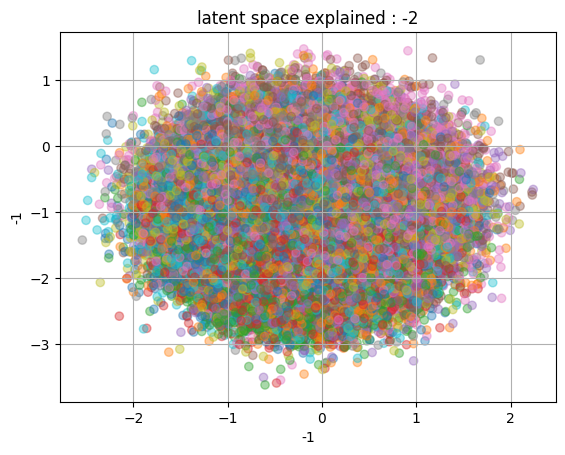

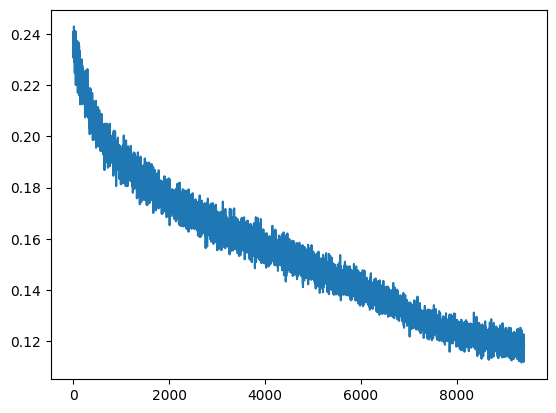

In [11]:
md = MultiDistillMeModule(in_channels=3,
        img_size=64,
        latent_dim_t=2,
        latent_dim_s=2,)

optim = torch.optim.SGD(md.parameters())
device, _ = set_device()
md.to(device)
losses = []
kl_s=[]
kl_t=[]
reco=[]

for epoch in range(1) :

    total_loss = 0.0
    #train loop
    md.train()
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        optim.zero_grad()

        mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images)
               
        loss = mse(image_hat_logits, images)

        loss.backward()
        optim.step()
        total_loss+=loss.item()
        if i%50 : 
            losses.append(loss.item())
    print(total_loss)


    ### eval
    md.eval()
    z_list = []
    labels_list = []
    #show train latent space
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad() : mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images, test=True)

        z_list.append(z_t.detach().cpu())
        labels_list.append(labels.detach().cpu())
    z = torch.cat(z_list)
    labels = torch.cat(labels_list)
    display_latent(labels[:,0].unsqueeze(1), z=z)
    z_list = []
    labels_list = []
    

plt.plot(range(len(losses)), losses)
plt.show()

### KL

Nombre de GPU : 4

[ GPU 0 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.04 Go
Mémoire réservée : 0.37 Go

[ GPU 1 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 2 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 3 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go
current device is 0
1570.7495333850384
1247.6292878985405
1213.3552682176232
1203.1955122500658
1197.7090783938766


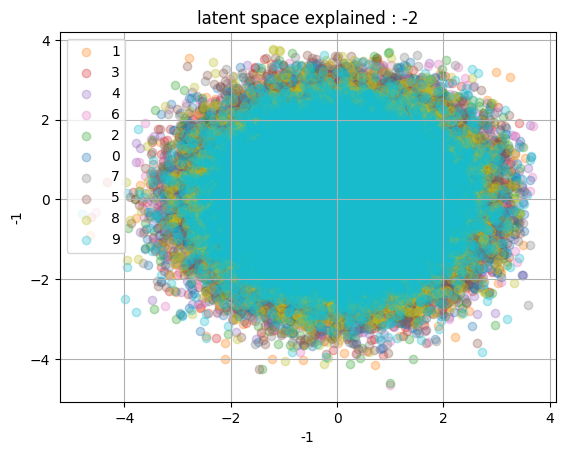

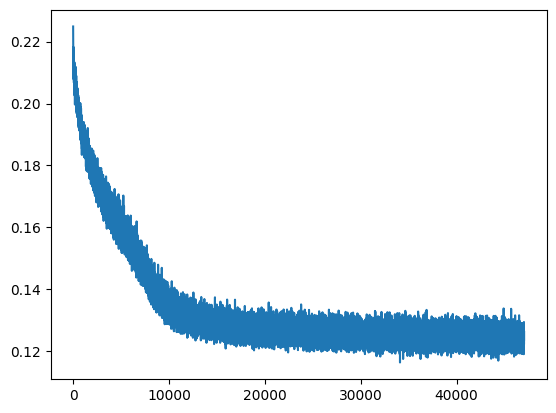

In [ ]:
md = MultiDistillMeModule(in_channels=3,
        img_size=64,
        latent_dim_t=2,
        latent_dim_s=2,)

optim = torch.optim.SGD(md.parameters())
device, _ = set_device()
md.to(device)
losses = []
kl_s=[]
kl_t=[]
reco=[]

for epoch in range(5) :

    total_loss = 0.0
    #train loop
    md.train()
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        optim.zero_grad()

        mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images)
               
        loss = 100*md.hparams.kl_weight*kl(*mus_logvars_s)+100*md.hparams.kl_weight*kl(*mus_logvars_t)+mse(image_hat_logits, images)

        loss.backward()
        optim.step()
        total_loss+=loss.item()
        if i%50 : 
            losses.append(loss.item())
            #contrs.append(criterion(z_t, labels[:, 0]).item())
            kl_s.append(kl(*mus_logvars_s).item())
            kl_t.append(kl(*mus_logvars_t).item())
            # reco.append(mse(image_hat_logits, images))
    print(total_loss)


    ### eval
    md.eval()
    z_list = []
    labels_list = []
    #show train latent space
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad() : mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images, test=True)

        z_list.append(z_t.detach().cpu())
        labels_list.append(labels.detach().cpu())
    z = torch.cat(z_list)
    labels = torch.cat(labels_list)
    display_latent(labels[:,0].unsqueeze(1), z=z)
    z_list = []
    labels_list = []
    

plt.plot(range(len(losses)), losses)
plt.show()

### Contrastive

Nombre de GPU : 4

[ GPU 0 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 1 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 2 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 3 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go
current device is 0
149.3248970794957


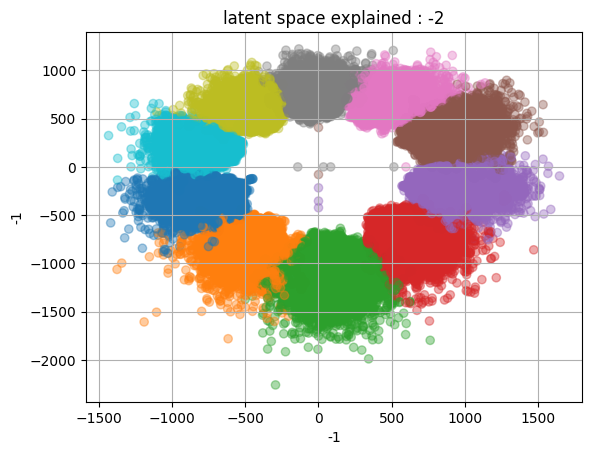

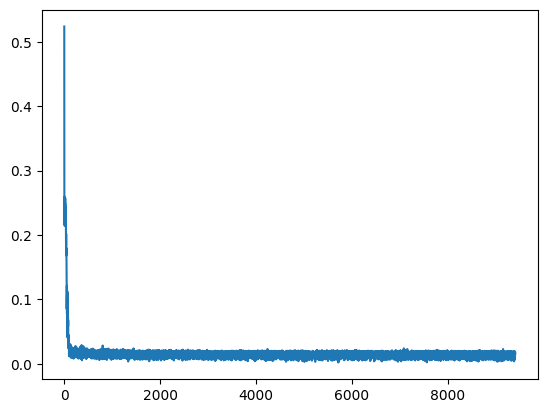

In [7]:
md = MultiDistillMeModule(in_channels=3,
        img_size=64,
        latent_dim_t=2,
        latent_dim_s=2,)

criterion = InfoNCESupervised()
optim = torch.optim.AdamW(md.parameters())
device, _ = set_device()
md.to(device)
losses = []
contrs=[]
kl_s=[]
kl_t=[]
reco=[]

for epoch in range(1) :

    total_loss = 0.0
    #train loop
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        optim.zero_grad()

        mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images)
               
        #loss = 0.1*criterion(z_t, labels[:, 0]) + md.hparams.kl_weight*kl(*mus_logvars_s)+md.hparams.kl_weight*kl(*mus_logvars_t)+mse(image_hat_logits, images)
        loss = 0.1*criterion(z_t, labels[:, 0])
        loss.backward()
        optim.step()
        total_loss+=loss.item()
        if i%50 : 
            losses.append(loss.item())
            #contrs.append(criterion(z_t, labels[:, 0]).item())
            # kl_s.append(kl(*mus_logvars_s).item())
            # kl_t.append(kl(*mus_logvars_t).item())
            # reco.append(mse(image_hat_logits, images))
    print(total_loss)
    

for epoch in range(1) :
    z_list = []
    labels_list = []
    #show train latent spaceLe Câble 1 reliera le Bois Matar à la station de métro Pointe du Lac en quatorze minutes[8],[3] soit un gain de temps important par rapport aux bus et à l'automobile. Il permettra de desservir notamment le quartier des Temps Durables, le parc départemental de la Plage Bleue, les zones urbaines sensibles de Saint-Martin, du quartier d'Île-de-France, des Polognes et du Bois Matar.


    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad() :mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images, test=True)

        z_list.append(z_t.detach().cpu())
        labels_list.append(labels.detach().cpu())
    z = torch.cat(z_list)
    labels = torch.cat(labels_list)
    display_latent(labels[:,0].unsqueeze(1), z=z)
    z_list = []
    labels_list = []

plt.plot(range(len(losses)), losses)
plt.show()

### Anti nce


In [1]:
class AntiNCE(nn.Module) :

    def __init__(self, factor: int, Dataset_type=Shapes3D) :
        super().__init__()
        self.factor = factor
        self.Dataset_type = Dataset_type
        self.factor_name = self.Dataset_type.Params.FACTORS_IN_ORDER[self.factor]
        self.num_values = self.Dataset_type.Params.NUM_VALUES_PER_FACTOR[self.factor_name]
        self.eps = 1e-7

    def forward(self, mu_logvars_s: tuple[torch.Tensor, torch.Tensor], labels: torch.Tensor) -> torch.Tensor :
        """
        Args:
            mu_logvars_s : encoder output
            labels : labels from the dataset
        Output:
            loss: float
        """
        factor_labels = labels[:, self.factor]
        total_kl = 0.0
        count = 0
        
        for i in range(self.num_values) :
            mask = (factor_labels == i)
            if mask.sum() < 2 : continue

            z_s = sample_from(mu_logvars_s)
            z = z_s[mask]

            mean = z.mean(dim=0)
            var = z.var(dim=0, unbiased=False) + self.eps
            kl_i = 0.5 * torch.sum(mean**2 + var - torch.log(var) - 1)
            total_kl += kl_i
            count += 1

        return total_kl / count if count > 0 else torch.tensor(0.0, device=mu_logvars_s.device)


KeyboardInterrupt



Nombre de GPU : 4

[ GPU 0 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.36 Go
Mémoire réservée : 0.55 Go

[ GPU 1 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 2 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 3 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go
current device is 0
nan


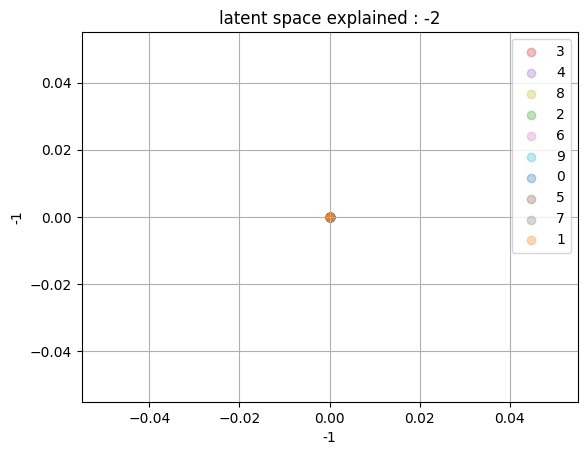

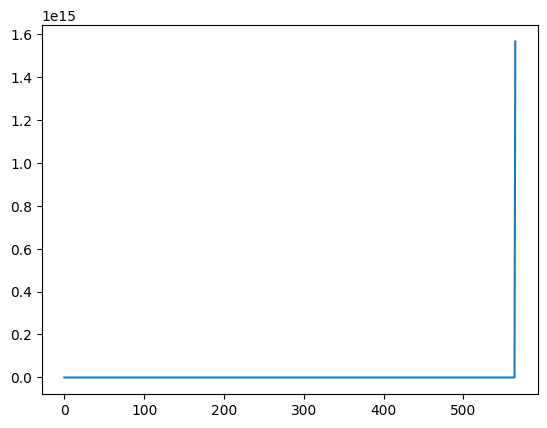

In [ ]:
md = MultiDistillMeModule(in_channels=3,
        img_size=64,
        latent_dim_t=2,
        latent_dim_s=2,)

optim = torch.optim.AdamW(md.parameters())
device, _ = set_device()
md.to(device)
criterion = AntiNCE(factor=0)

losses = []

for epoch in range(1) :

    total_loss = 0.0
    #train loop
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        optim.zero_grad()

        mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images)
               
        loss = criterion(mus_logvars_s, labels)

        loss.backward()
        optim.step()
        total_loss+=loss.item()
        if i%50 : 
            losses.append(loss.item())

    print(total_loss)
    

for epoch in range(1) :
    z_list = []
    labels_list = []
    
    #show train latent space
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad() :mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images, test=True)

        z_list.append(z_s.detach().cpu())
        labels_list.append(labels.detach().cpu())
    z = torch.cat(z_list)
    labels = torch.cat(labels_list)
    display_latent(labels[:,0].unsqueeze(1), z=z)
    z_list = []
    labels_list = []

plt.plot(range(len(losses)), losses)
plt.show()

In [16]:
len(losses)

9408

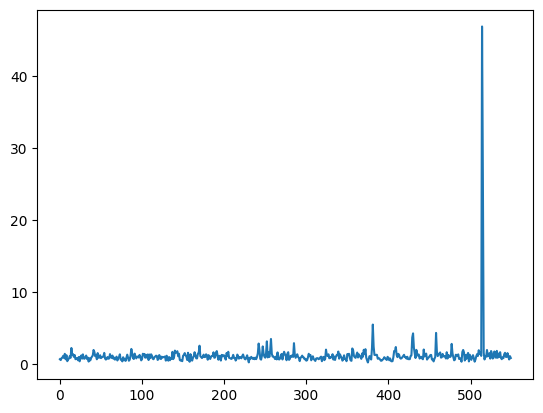

In [24]:
plt.plot(range(len(losses[:550])), losses[:550])
plt.show()

### Cross covariance

Nombre de GPU : 4

[ GPU 0 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.04 Go
Mémoire réservée : 0.39 Go

[ GPU 1 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 2 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 3 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go
current device is 0
0.13877274423207542


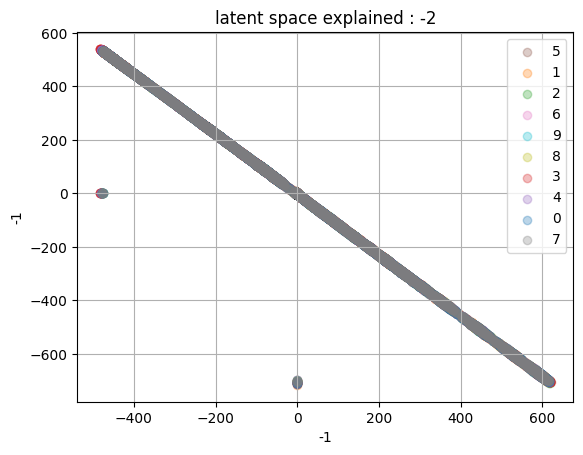

0.00650703260012836


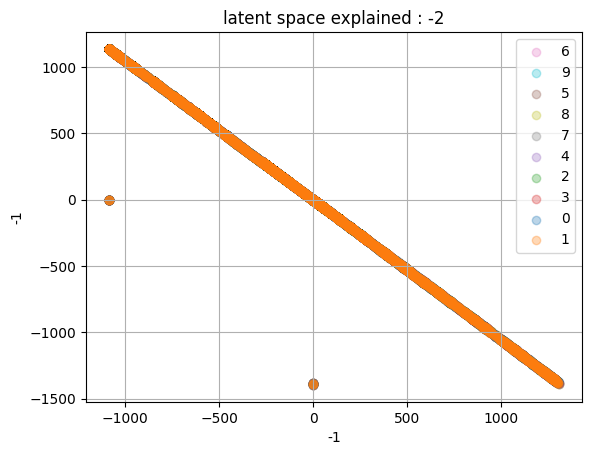

0.0014357730247233635


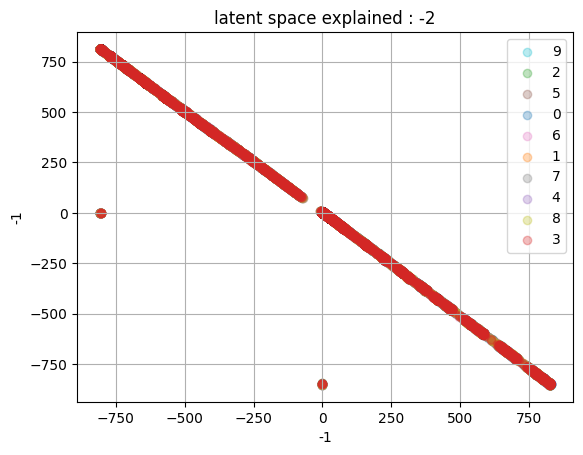

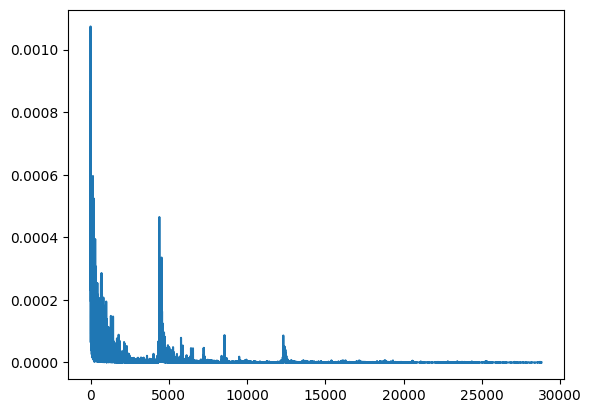

In [17]:
md = MultiDistillMeModule(in_channels=3,
        img_size=64,
        latent_dim_t=2,
        latent_dim_s=2,)

criterion = InfoNCESupervised()
optim = torch.optim.AdamW(md.parameters())
device, _ = set_device()
md.to(device)
log_loss = []
log_cov = []

for epoch in range(3) :
    md.train()
    total_loss = 0.0
    #train loop
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        optim.zero_grad()

        mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images)
        cov_frob = 1e-3*decorrelate_params(*mus_logvars_s, *mus_logvars_t)
        #loss = cov_frob+1e-1*criterion(z_t, labels[:, 0]) + md.hparams.kl_weight*kl(*mus_logvars_s)+md.hparams.kl_weight*kl(*mus_logvars_t)+mse(image_hat_logits, images)
        loss = cov_frob
        loss.backward()
        optim.step()
        total_loss+=loss.item()
        log_loss.append(loss.item())
        log_cov.append(cov_frob.item())

        #if i%10000000000 : log_cross_cov_heatmap(*mus_logvars_s, *mus_logvars_t, save_path="disdiff_adapters/notebook/cov.png", interactive=True)
    print(total_loss)


    z_list = []
    labels_list = []
    md.eval()
    #show train latent space
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad() :mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images, test=True)

        z_list.append(z_t.detach().cpu())
        labels_list.append(labels.detach().cpu())
    z = torch.cat(z_list)
    labels = torch.cat(labels_list)
    display_latent(labels[:,0].unsqueeze(1), z=z)
    z_list = []
    labels_list = []
            
plt.plot(range(len(log_loss)), log_loss)
plt.show()


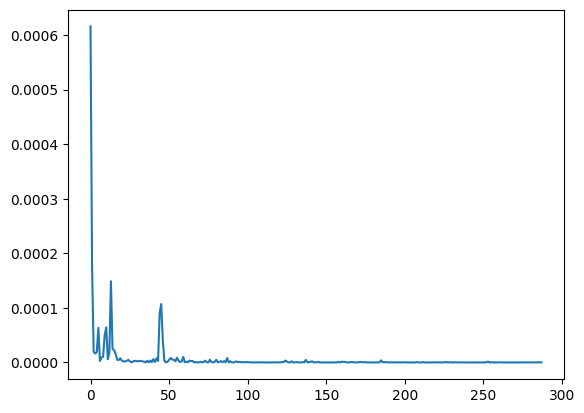

In [18]:
plt.plot(range(len(log_cov[::100])), log_cov[::100])
plt.show()

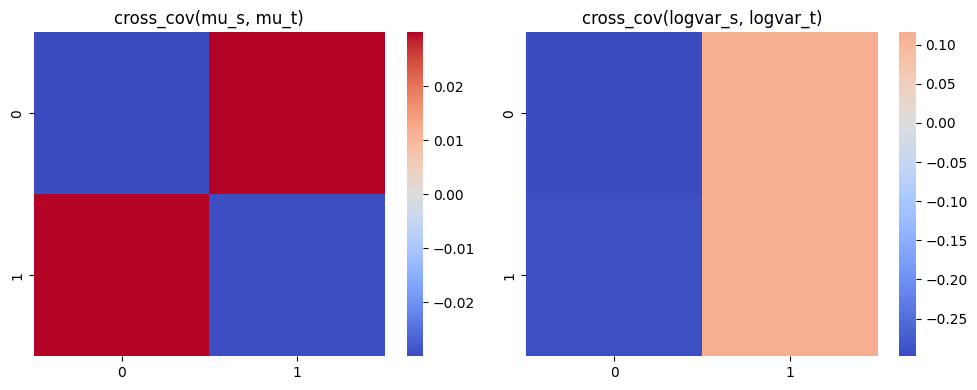

<Figure size 640x480 with 0 Axes>

In [22]:
log_cross_cov_heatmap(*mus_logvars_s, *mus_logvars_t, save_path="path_heatmap.png", interactive=True)

### Warm-up : contrastive/clustering

Nombre de GPU : 4

[ GPU 0 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.13 Go
Mémoire réservée : 0.53 Go

[ GPU 1 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 2 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go

[ GPU 3 ]
Nom : NVIDIA A100 80GB PCIe
Mémoire totale : 84.97 Go
Mémoire utilisée : 0.0 Go
Mémoire réservée : 0.0 Go
current device is 0


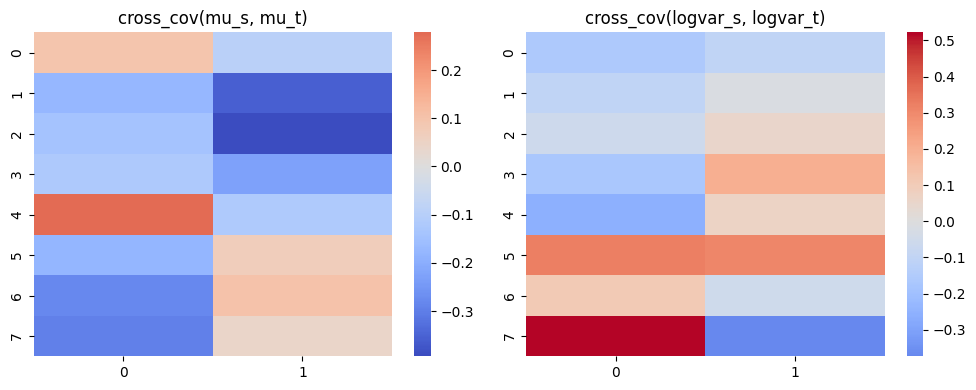

<Figure size 640x480 with 0 Axes>

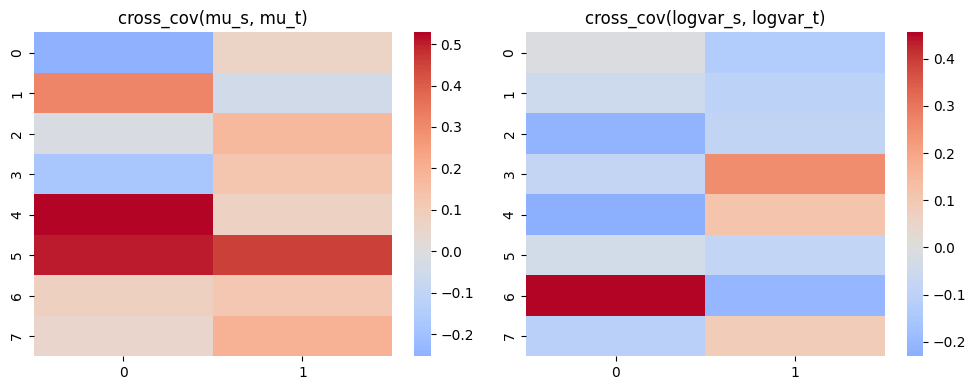

<Figure size 640x480 with 0 Axes>

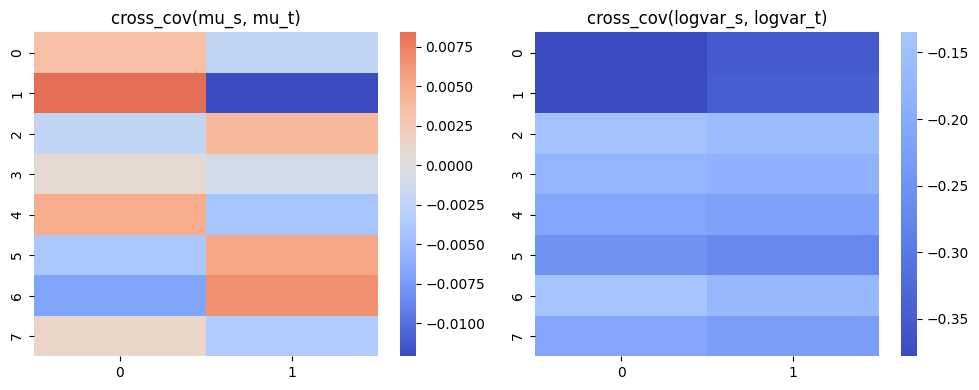

6274.515293570235


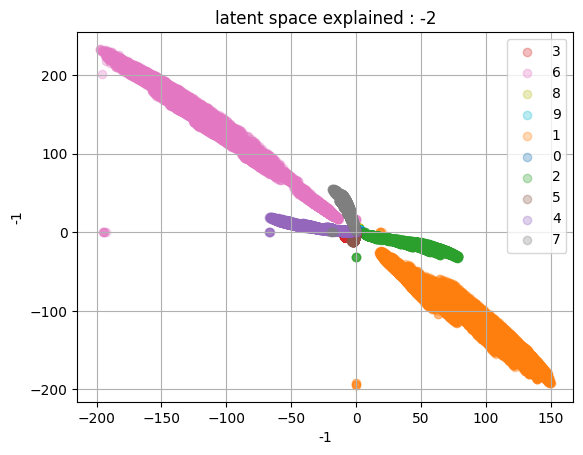

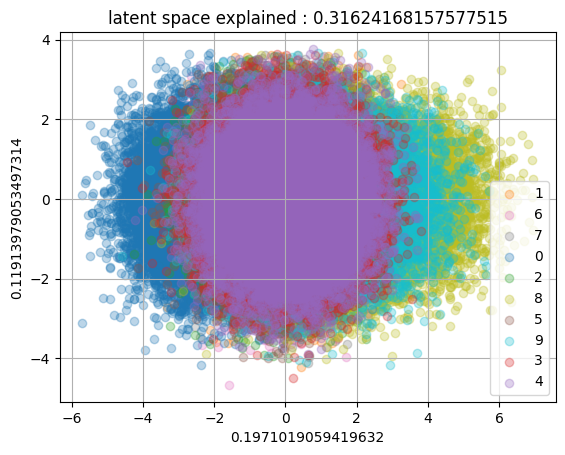

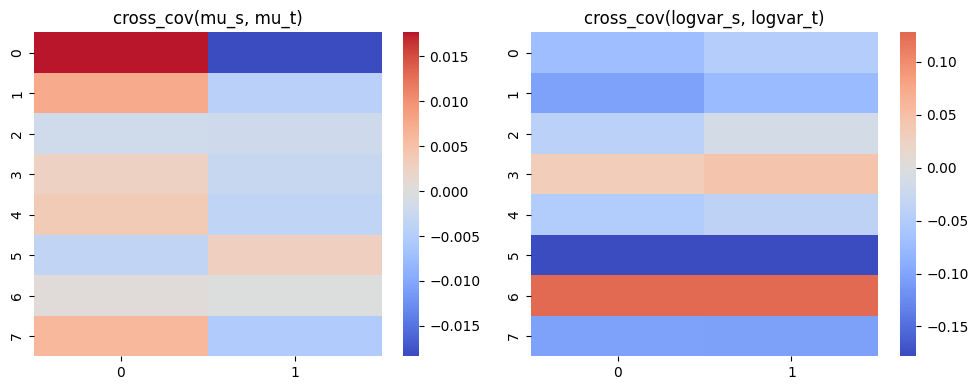

<Figure size 640x480 with 0 Axes>

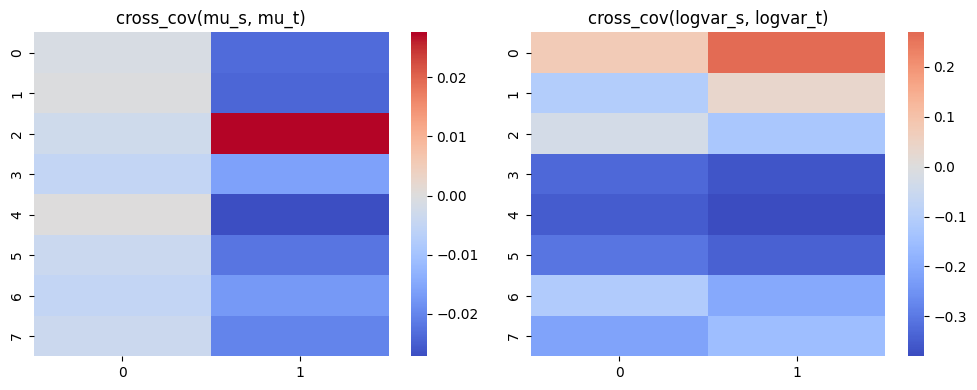

<Figure size 640x480 with 0 Axes>

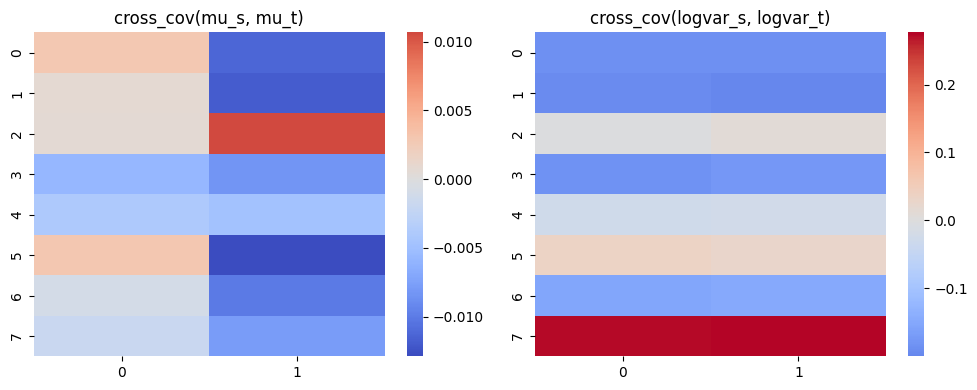

1041228.7062836513


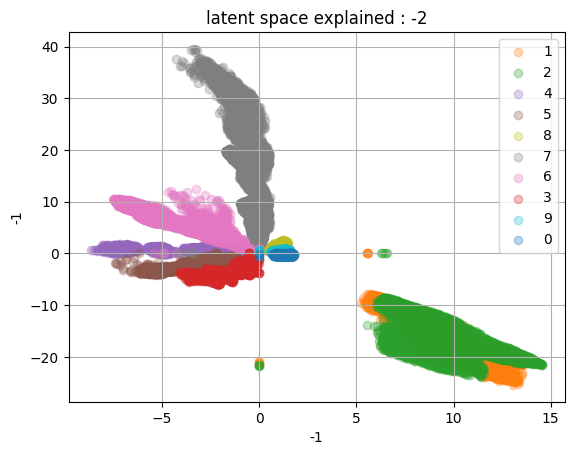

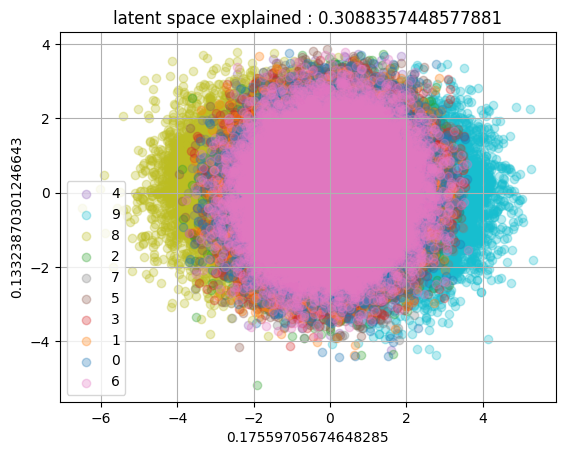

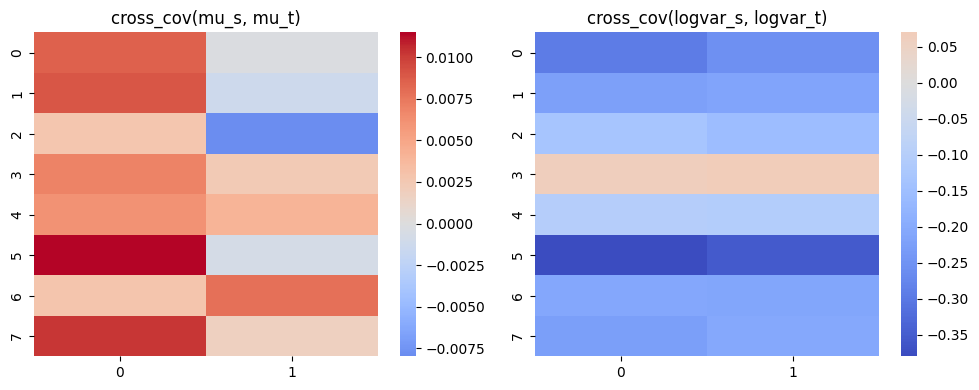

<Figure size 640x480 with 0 Axes>

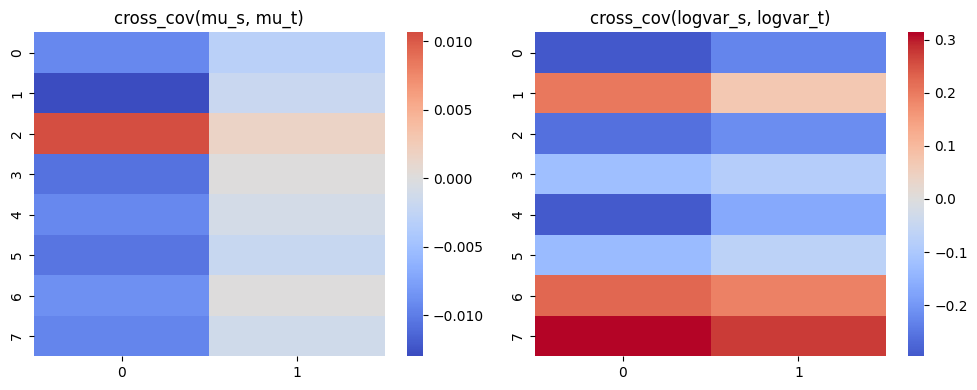

<Figure size 640x480 with 0 Axes>

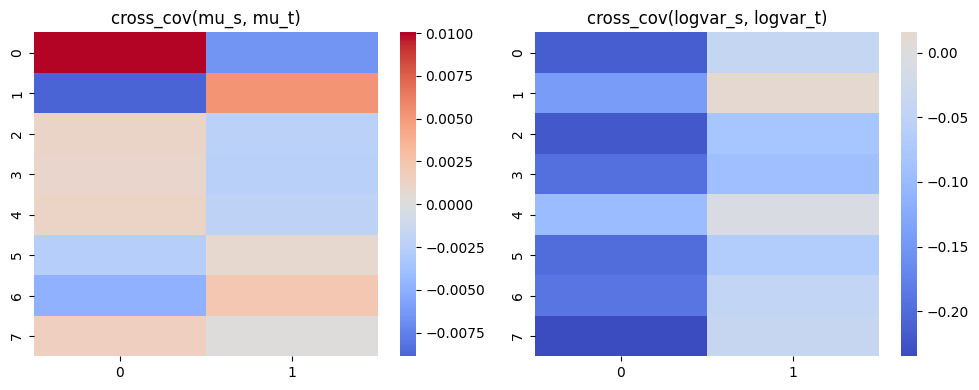

2260.0429188013077


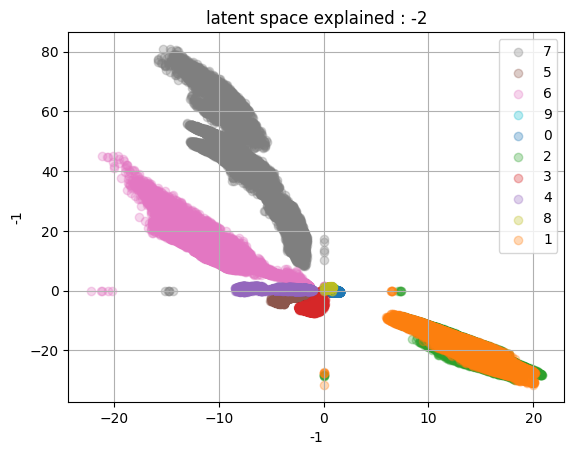

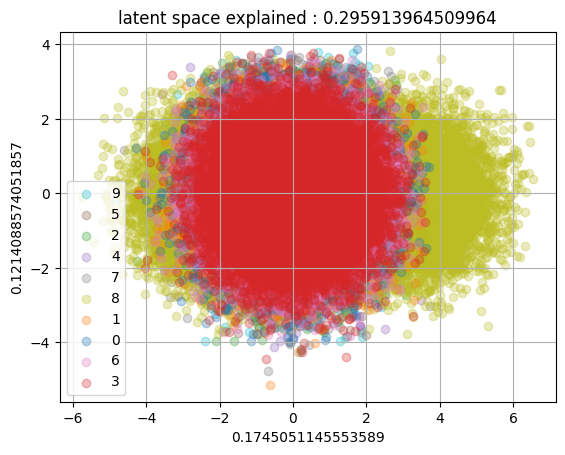

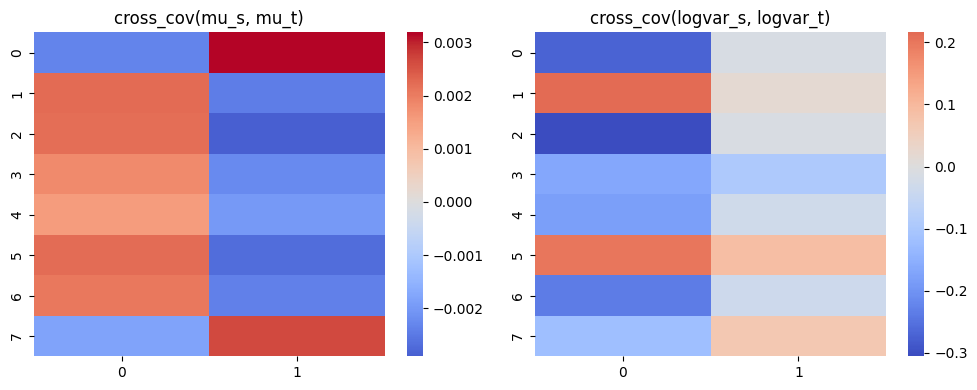

<Figure size 640x480 with 0 Axes>

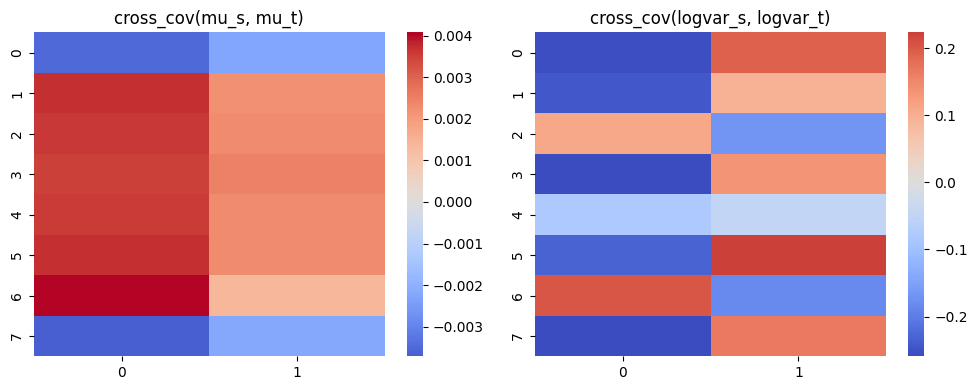

<Figure size 640x480 with 0 Axes>

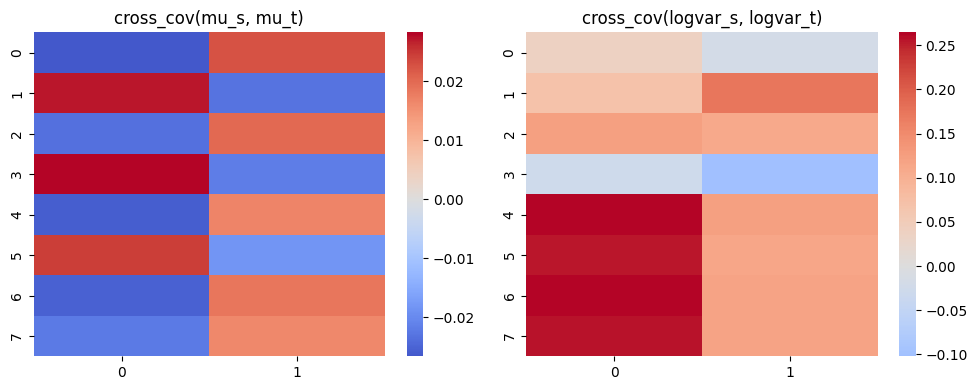

12544929969.60945


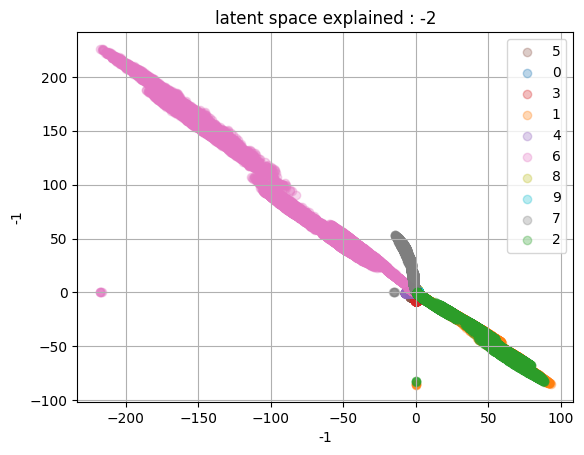

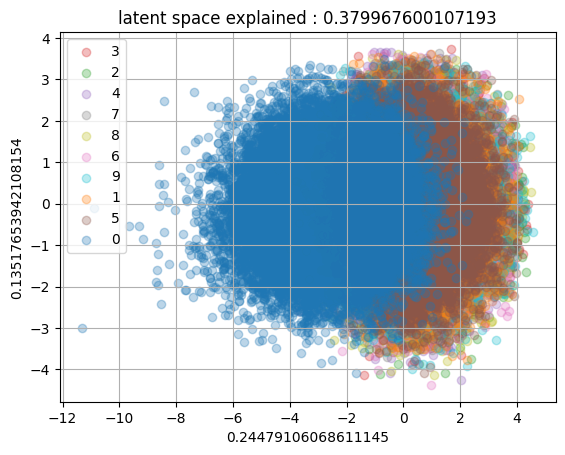

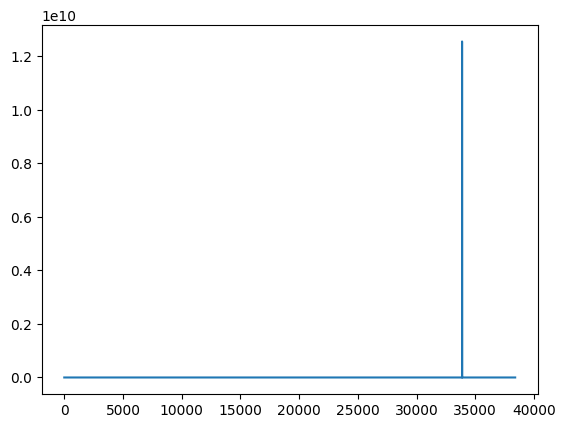

In [49]:
md = MultiDistillMeModule(in_channels=3,
        img_size=64,
        latent_dim_t=2,
        latent_dim_s=8,)

criterion = InfoNCESupervised()
optim = torch.optim.AdamW(md.parameters())
device, _ = set_device()
md.to(device)
log_loss = []
log_cov = []
log_con = []
step = 0

for epoch in range(4) :
    md.train()
    total_loss = 0.0
    #train loop
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        optim.zero_grad()

        mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images)
        cov_frob = 5*1e-1*decorrelate_params(*mus_logvars_s, *mus_logvars_t)
        contrastive = 1e-1*criterion(z_t, labels[:, 0])

        if step<7000 : loss = contrastive + md.hparams.kl_weight*kl(*mus_logvars_s)+md.hparams.kl_weight*kl(*mus_logvars_t)+mse(image_hat_logits, images)
        else : loss = cov_frob + contrastive + 1e4*md.hparams.kl_weight*kl(*mus_logvars_s)+md.hparams.kl_weight*kl(*mus_logvars_t)+mse(image_hat_logits, images)
        step+=1
        loss.backward()
        optim.step()
        total_loss+=loss.item()

        log_loss.append(loss.item())
        log_cov.append(cov_frob.item())
        log_con.append(contrastive.item())
        if not i%4500 : log_cross_cov_heatmap(*mus_logvars_s, *mus_logvars_t, "cov.png", True)

    print(total_loss)


    z_t_list = []
    z_s_list = []
    labels_list = []
    md.eval()
    #show train latent space
    for i,batch in enumerate(shapes_loader) :
        images, labels = batch
        images, labels = images.to(device), labels.to(device)
        with torch.no_grad() :mus_logvars_s, mus_logvars_t, image_hat_logits, z_s, z_t, z = md(images, test=True)

        z_t_list.append(z_t.detach().cpu())
        z_s_list.append(z_s.detach().cpu())
        labels_list.append(labels.detach().cpu())
    z_t = torch.cat(z_t_list)
    z_s = torch.cat(z_s_list)
    labels = torch.cat(labels_list)
    display_latent(labels[:,0].unsqueeze(1), z=z_t)
    display_latent(labels[:,0].unsqueeze(1), z=z_s)
    z_t_list = []
    z_s_list = []
    labels_list = []
            
plt.plot(range(len(log_loss)), log_loss)
plt.show()


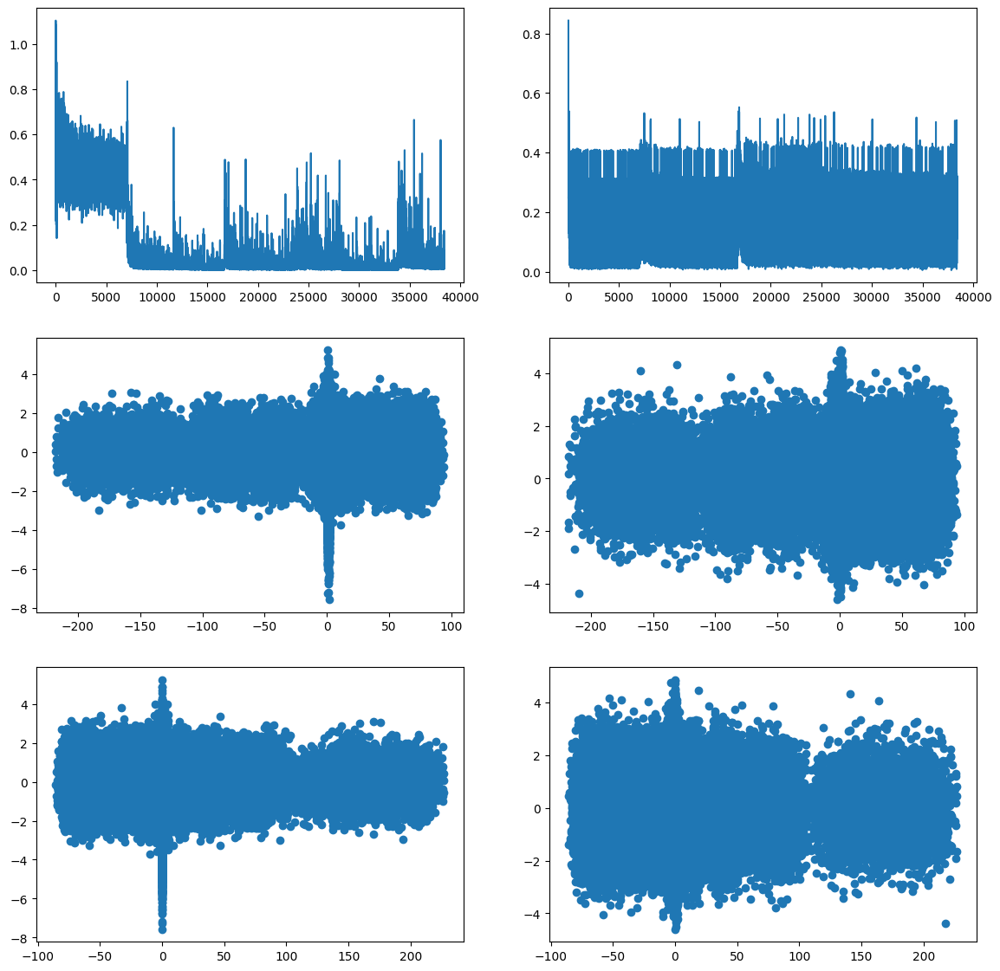

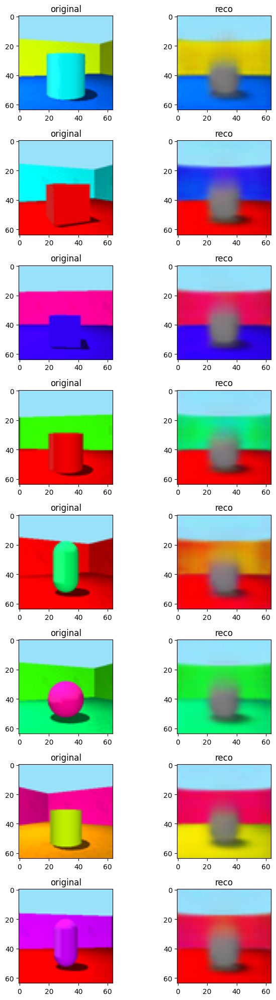

interactive mode : on


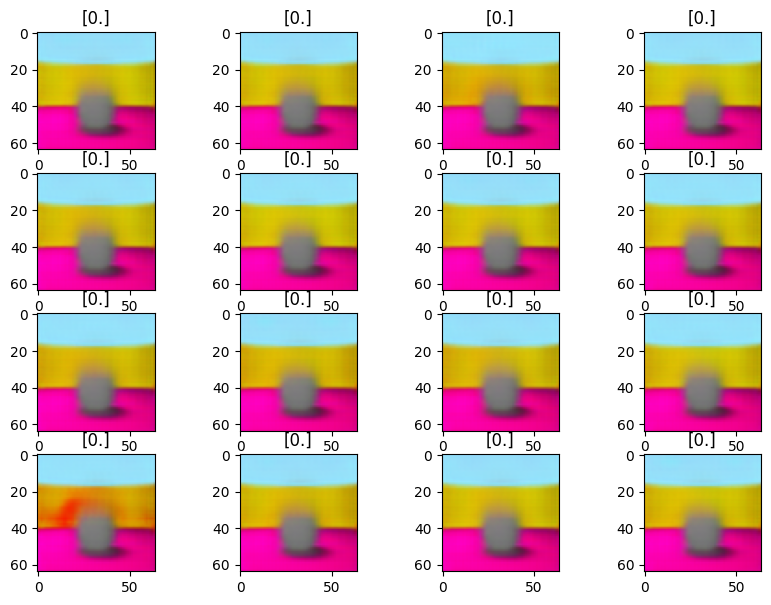

In [50]:
#Evaluation

fig, axes = plt.subplots(3, 2, figsize=(14, 14))
axes[0,0].plot(range(len(log_cov)), log_cov)
axes[0,1].plot(range(len(log_con)), log_con)
axes[1,0].scatter(z_t[:, 0],z_s[:, 0])
axes[1,1].scatter(z_t[:, 0], z_s[:, 1])
axes[2,0].scatter(z_t[:, 1], z_s[:, 0])
axes[2,1].scatter(z_t[:, 1], z_s[:, 1])
plt.show()
md.show_reconstruct(images)
gen_images = md.generate_cond(cond="s", z_t=z_t, z_s=z_s)
gen_images = gen_images.to("cpu")
display((gen_images, 
        torch.zeros((gen_images.shape[0], 1),
                   ),)
        )

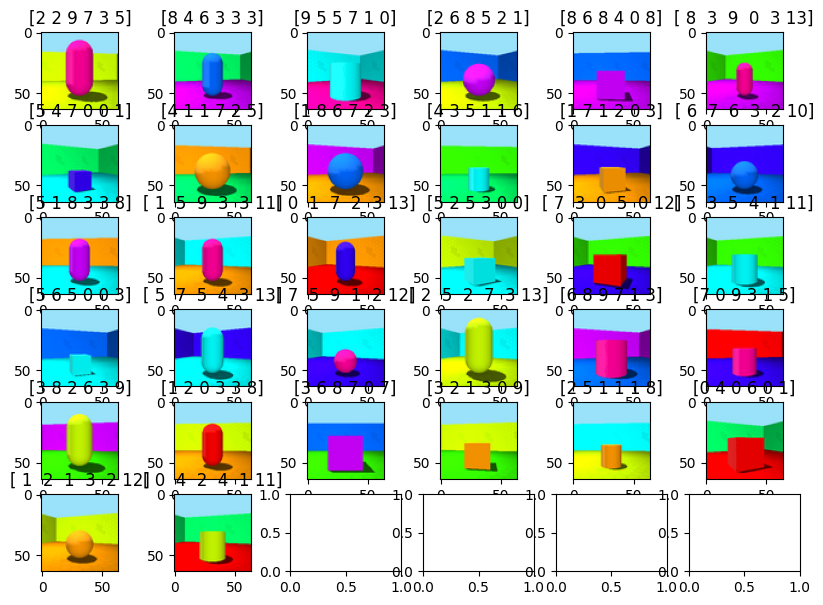

In [48]:
for batch in shapes_loader :
    images, labels = batch
    break
display((images, labels))

In [55]:
mus_logvars_s, mus_logvars_t, images_gen, z_s, z_t, z = md(images)

In [ ]:
nb_samples = z_s.shape[0]
print(nb_samples)


32


## Multi-Distillme

#### Train

In [ ]:
multi_dm = MultiDistillMeModule(in_channels=1, 
                                img_size=64, 
                                latent_dim_s=32, 
                                latent_dim_t=2, 
                                res_block=ResidualBlock,
                                l_nce=1.0,
                                beta_s=100.0,
                                select_factor=1,
                                factor_value=-1,
                                map_idx_labels=DSprites.Params.FACTORS_IN_ORDER)
max_epochs=1
trainer = Trainer(gradient_clip_val= 3.0,
            max_epochs=max_epochs,
            log_every_n_steps=7,)

Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | model        | _MultiDistillMe   | 3.7 M  | train
1 | constrastive | InfoNCESupervised | 0      | train
-----------------------------------------------------------
3.7 M     Trainable params
0         Non-trainable params
3.7 M     Total params
14.697    Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Epoch 0: 100%|██████████| 14746/14746 [08:43<00:00, 28.17it/s, v_num=36]

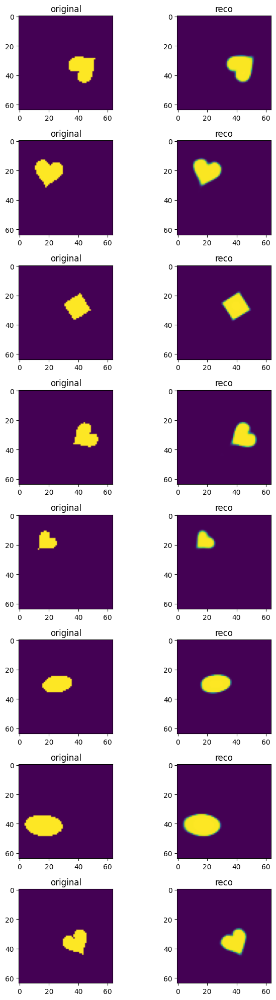

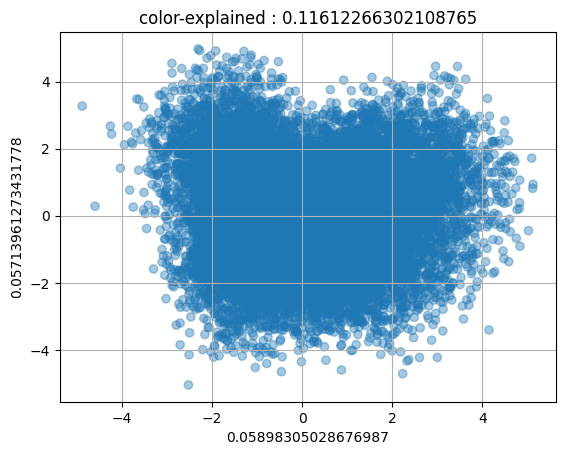

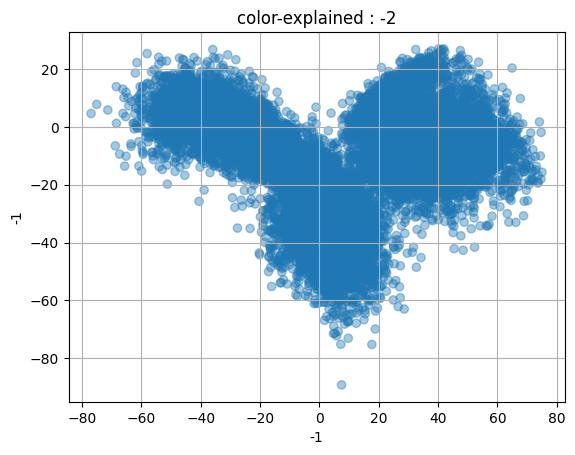

Epoch 0:   0%|          | 0/14746 [23:28<?, ?it/s]


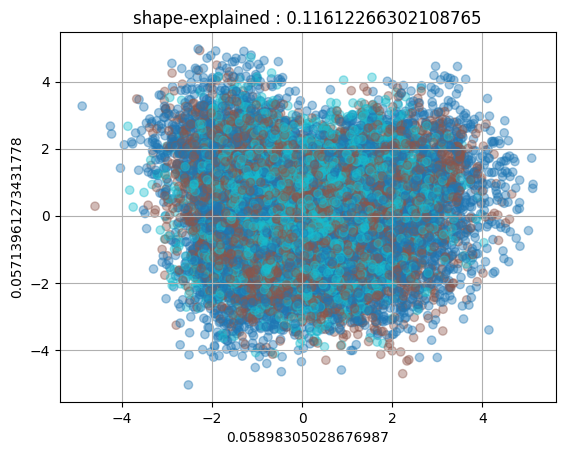

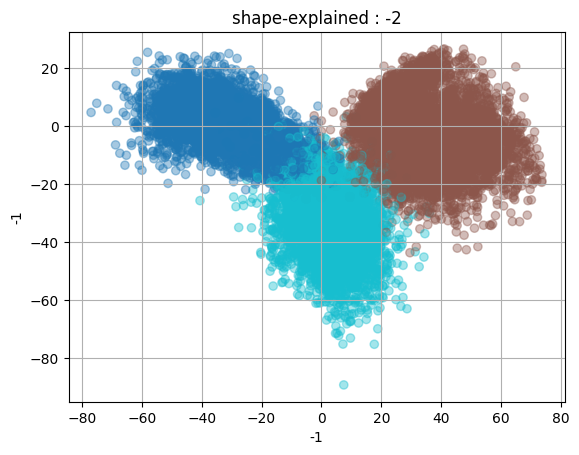

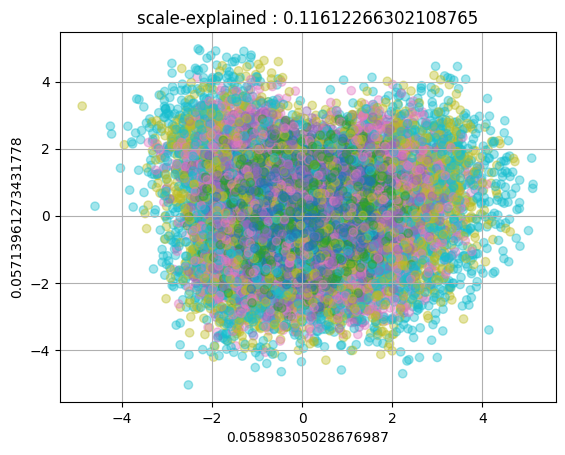

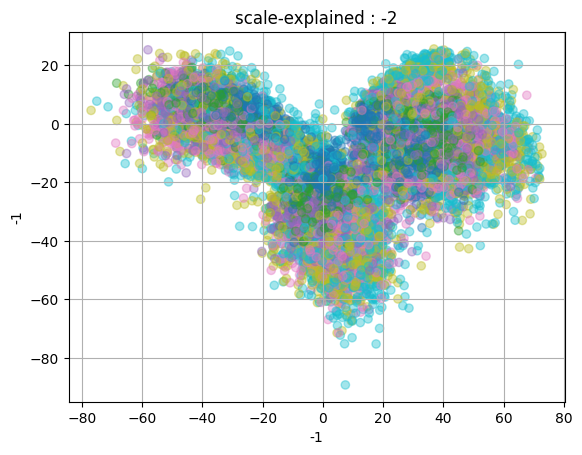

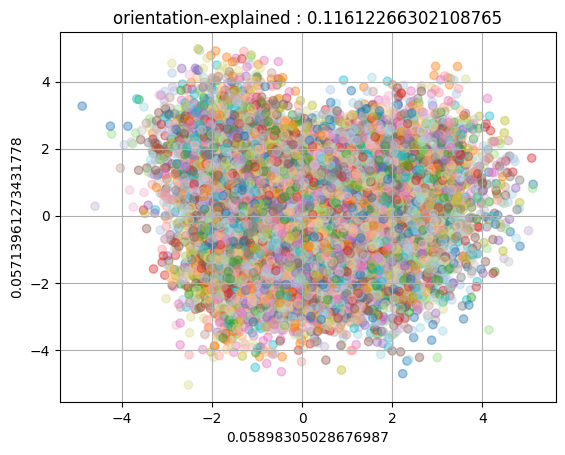

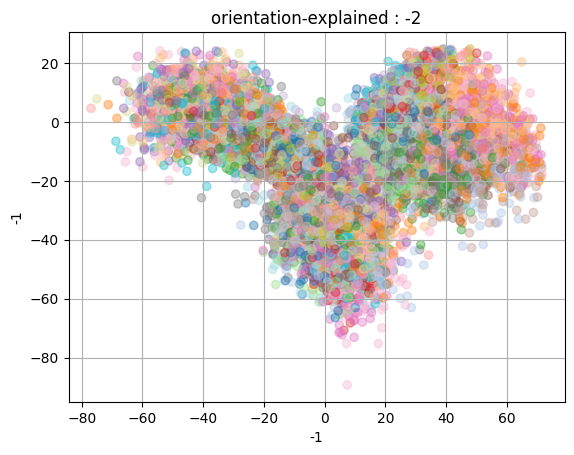

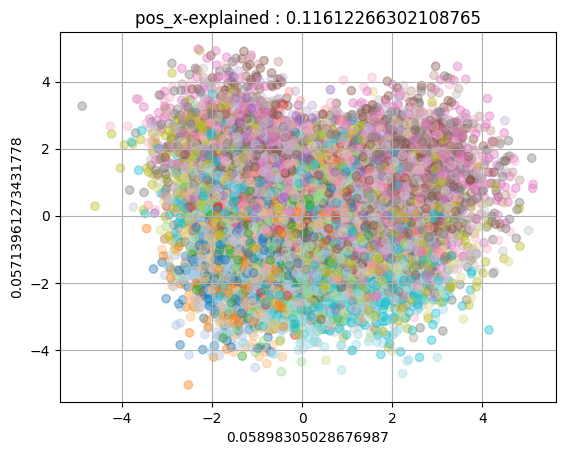

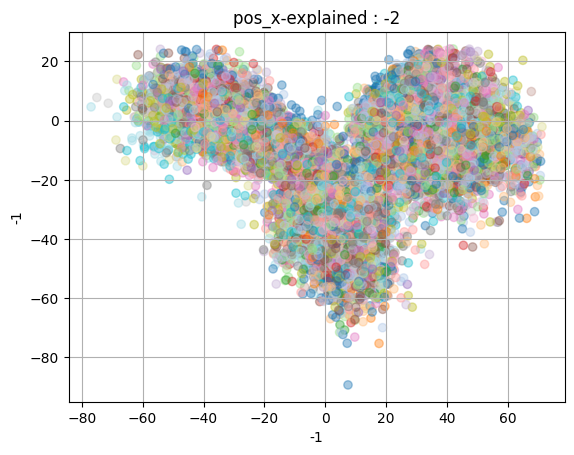

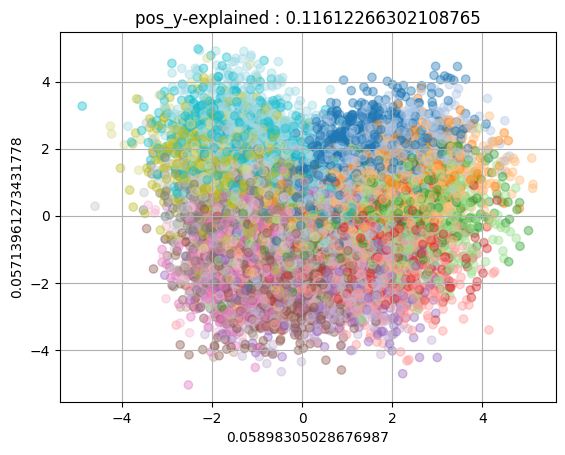

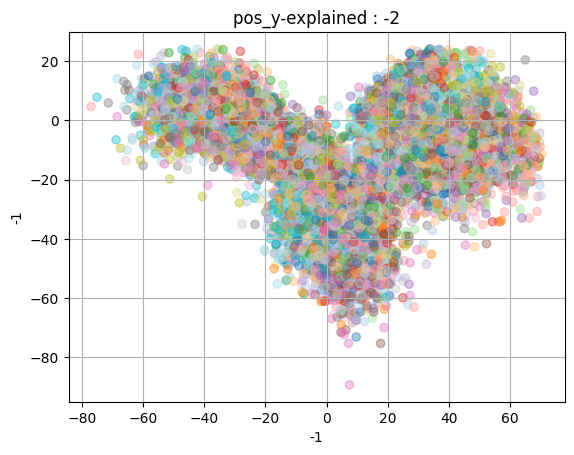

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 14746/14746 [09:06<00:00, 27.00it/s, v_num=36]


In [25]:
trainer.fit(multi_dm, loader)

In [11]:
multi_dm.reload_latent()

torch.Size([4097, 3, 64, 64])
torch.Size([4097, 3, 64, 64])
torch.Size([4097, 3, 64, 64])
torch.Size([4097, 3, 64, 64])
torch.Size([4097, 3, 64, 64])
torch.Size([1947, 3, 64, 64])



cmap : personalised



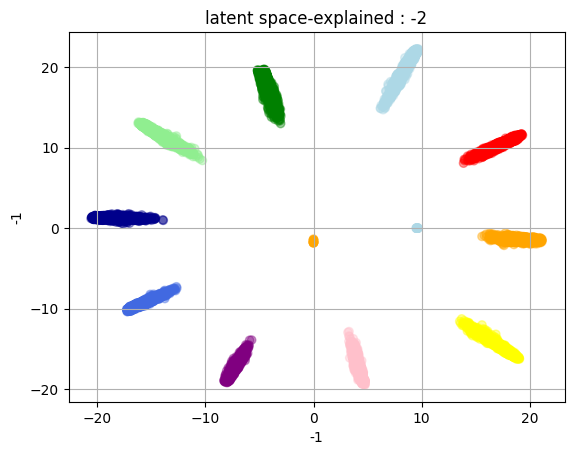

In [14]:
z_t = multi_dm.latent_train_buff["t"]
labels = multi_dm.labels_train_buff[:, 1].unsqueeze(1)
display_latent(labels=labels, z=z_t)

In [16]:
def generate_cond(self, nb_samples: int=16, cond: str="t", pos: int=0, 
                    z_t=None, z_s=None, img_ref=None, factor_value=None) :
    
    assert (z_t is None) == (z_s is None), "You must specified z_s and z_t, or none of them"

    if z_t is None : 
        z_t= self.latent_train_buff["t"]
        z_s = self.latent_train_buff["s"]
    else : print("interactive mode : on")

    if factor_value is not None :
        mask = (self.labels_train_buff[:, self.hparams.select_factor] == factor_value)
        z_t = z_t[mask]
        z_s = z_s[mask]

    if cond == "t" :
        nb_sample_latent = z_t.shape[0]
        assert nb_samples <= nb_sample_latent, "Too much points"

        idx_t = torch.randint_like(torch.zeros([nb_samples]), high=nb_sample_latent, dtype=torch.int32)
        eps_t = z_t[idx_t].to(self.device)

        if img_ref is None :
            eps_s = torch.stack(nb_samples*[z_s[pos]]).to(self.device)
        else : 
            with torch.no_grad() : _, _, _, eps_s, _, _ = self(img_ref.to(self.device), test=True)
            eps_s = torch.cat(nb_samples*[eps_s]).to(self.device)

        assert eps_s.device == eps_t.device, "eps_s, eps_t have to be on the same device"
        z = self.model.merge_operation(eps_s, eps_t)


    elif cond == "s" :
        nb_sample_latent = z_s.shape[0] 
        assert nb_samples <= nb_sample_latent, "Too much points" 

        idx_s = torch.randint_like(torch.zeros([nb_samples]), high=nb_sample_latent, dtype=torch.int32)
        eps_s = z_s[idx_s].to(self.device)

        if img_ref is None :
            eps_t = torch.stack(nb_samples*[z_t[pos]]).to(self.device)
        else : 
            with torch.no_grad() : _, _, _, _, eps_t, _ = self(img_ref.to(self.device))
            eps_t = torch.cat(nb_samples*[eps_t]).to(self.device)
        assert eps_t.device == eps_s.device, "eps_s, eps_t have to be on the same device"
        z = self.model.merge_operation(eps_s, eps_t)
    else : raise ValueError("cond has to be equal to either s or t")

    x_hat_logits = self.model.decoder(z)
    return x_hat_logits.detach().cpu(), self.images_train_buff[pos].unsqueeze(0).detach().cpu()


In [ ]:
mask = (multi_dm.labels_train_buff[:, multi_dm.hparams.select_factor] == multi_dm.hparams.factor_value)
print(mask.shape)
z_t= multi_dm.latent_train_buff["t"]
z_s = multi_dm.latent_train_buff["s"]
z_t = z_t[mask]
z_s = z_s[mask]

torch.Size([162770])


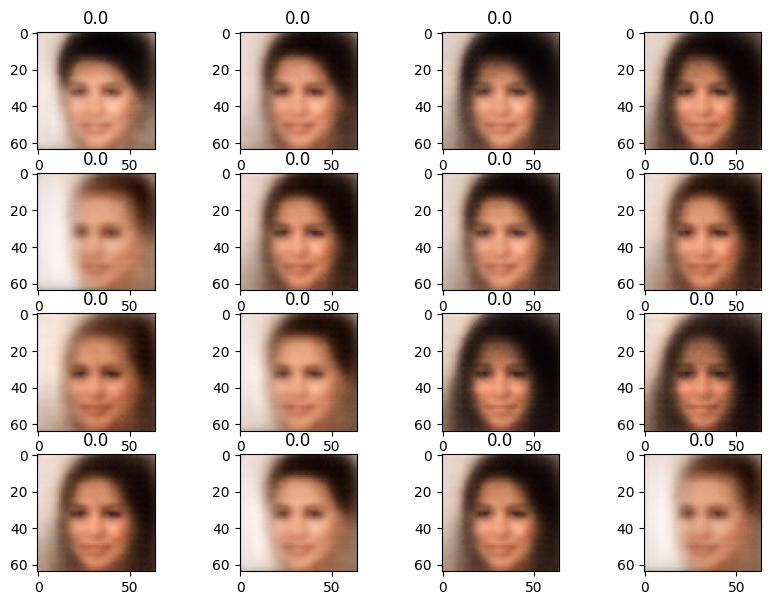

In [ ]:
gen, ref = multi_dm.generate_cond(cond="t")
display((torch.cat(), torch.zeros(BATCH_SIZE)))

#### Test

In [ ]:
from lightning import LightningModule

def show_reconstruct(lm: MultiDistillMeModule, images: torch.Tensor) :
    images = images.to(lm.device)[:8]
    _,_, images_gen, *_ = lm(images, test=True)

    fig, axes = plt.subplots(len(images), 2, figsize=(7, 20))

    for i in range(len(images)) :
        img = images[i]
        img_gen = images_gen[i]

        images_proc = (255*((img - img.min()) / (img.max() - img.min() + 1e-8))).to("cpu",torch.uint8).permute(1,2,0).detach().numpy()
        images_gen_proc = (255*((img_gen - img_gen.min()) / (img_gen.max() - img_gen.min() + 1e-8))).to("cpu",torch.uint8).permute(1,2,0).detach().numpy()

        axes[i,0].imshow(images_proc)
        axes[i,1].imshow(images_gen_proc)
            
        axes[i,0].set_title("original")
        axes[i,1].set_title("reco")
    plt.tight_layout()
    plt.show()

def select_show(cond: int=0, val: int|float=0, loader: DataLoader=loader) :
    
    cur_val = -1
    while cur_val != val :
        images, labels = next(iter(loader))
        if val in labels[:, cond] : break
    
    display()


In [6]:
lm = MultiDistillMeModule.load_from_checkpoint("/projects/compures/alexandre/disdiff_adapters/disdiff_adapters/logs/md_vf2/celeba/loss_vae_nce/test_factor_floor/batch32/test_dim_s8/md_epoch=30_beta=(1000.0,1.0)_latent=(8,2)_batch=32_warm_up=False_lr=1e-05_arch=res+l_cov=0.5+l_nce=0.1+l_anti_nce=0.0_/checkpoints/epoch=13-step=71218.ckpt")

torch.Size([22432, 3, 64, 64])
torch.Size([4096, 3, 64, 64])
torch.Size([4096, 3, 64, 64])
torch.Size([4096, 3, 64, 64])
torch.Size([4096, 3, 64, 64])
torch.Size([4096, 3, 64, 64])


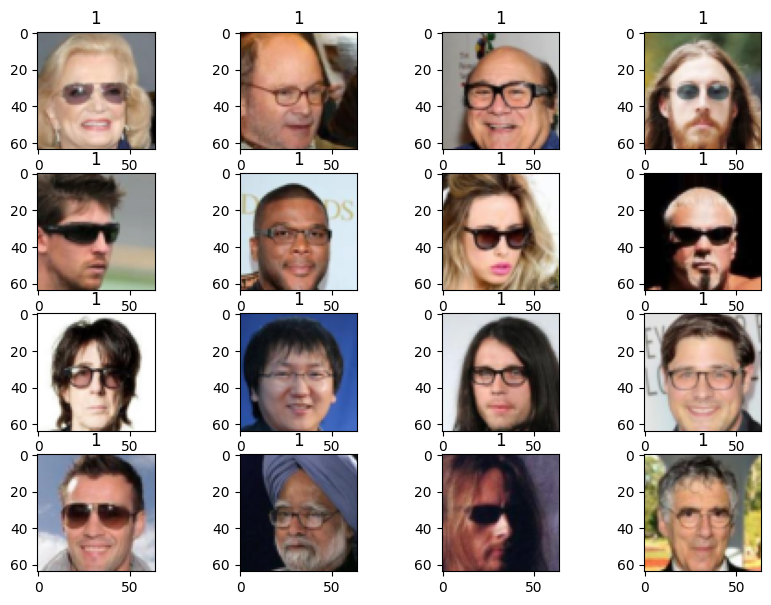

In [17]:
images, labels = batch
mask = (labels[:, 15]==1)
masked_img = images[mask]
masked_labels = labels[mask, 15]
display((masked_img, masked_labels))

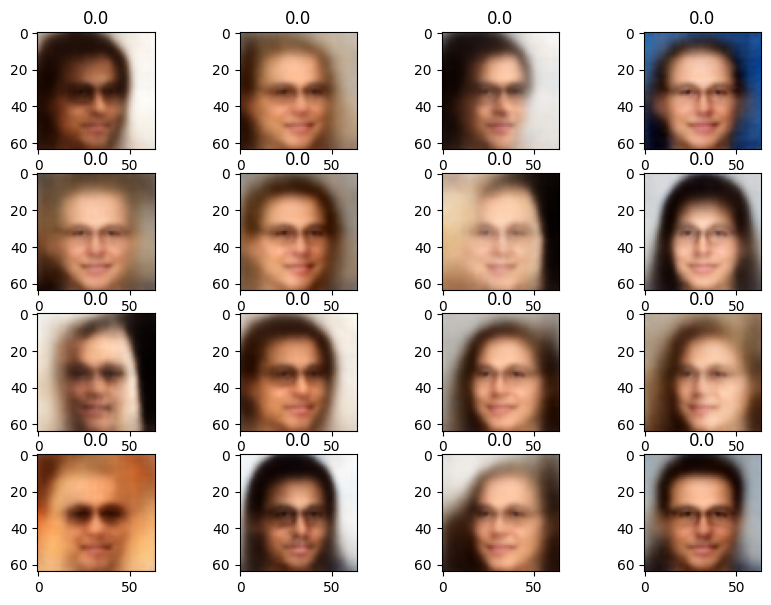

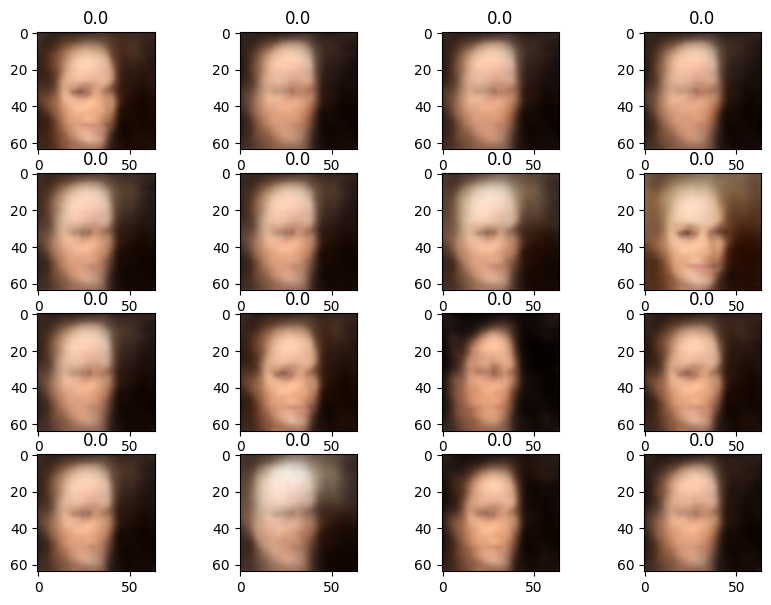

In [22]:
gen = lm.generate_cond(cond="s", img_ref = masked_img[1].unsqueeze(0))[0]
display((gen, torch.zeros(16)))
gen = lm.generate_cond(cond="t", img_ref = masked_img[1].unsqueeze(0))[0]
display((gen, torch.zeros(16)))

In [ ]:
celeba.setup(stage='test')
celeba_test = celeba.test_dataloader()
batch = next(iter(celeba_test))
images, labels = batch
display((lm.generate().cpu(), torch.zeros(8)))
show_reconstruct(lm, images)

: 

## Xfactors

In [14]:
xfactor = Xfactors(in_channels=3, 
                   img_size=64, 
                   latent_dim_s=8, 
                   select_factors=[0, 1, 2], 
                   dims_by_factors=[2, 2, 2], 
                   l_nce_by_factors=[1e-2, 1e-2, 1e-2])
trainer = Trainer(gradient_clip_val= 3.0,
            max_epochs=10,
            log_every_n_steps=7,)

Trainer will use only 1 of 4 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=4)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/projects/compures/alexandre/.venv/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:70: You defined a `validation_step` but have no `val_dataloader`. Skipping val loop.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name         | Type              | Params | Mode 
-----------------------------------------------------------
0 | model        | _MultiDistillMe   | 2.9 M  | train
1 | constrastive | InfoNCESupervised | 0      | train
-----------------------------------------------------------
2.9 M     Trainable params
0         Non-trainable params
2.9 M     Total params
11.761    Total estimated model params size (MB)
87        Modules in train mode
0         Modules in eval mode


Epoch 0: 100%|██████████| 9600/9600 [08:17<00:00, 19.31it/s, v_num=9]

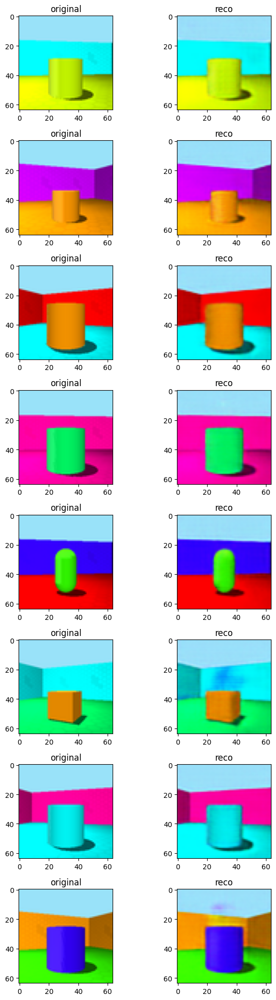

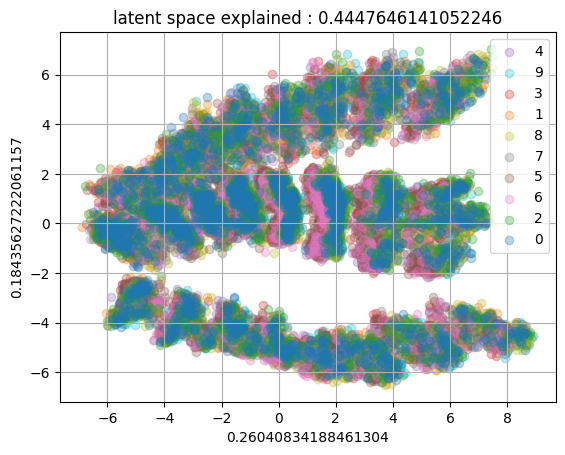

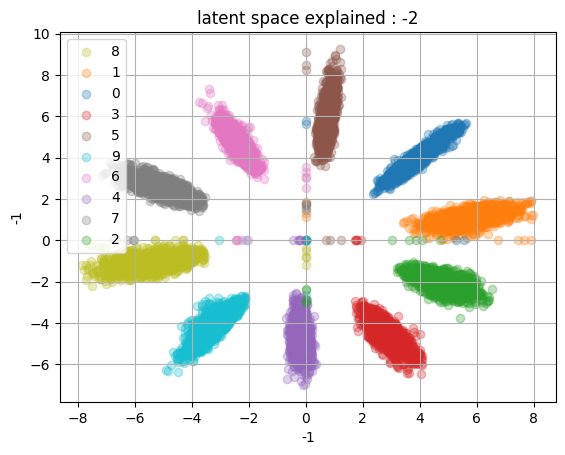

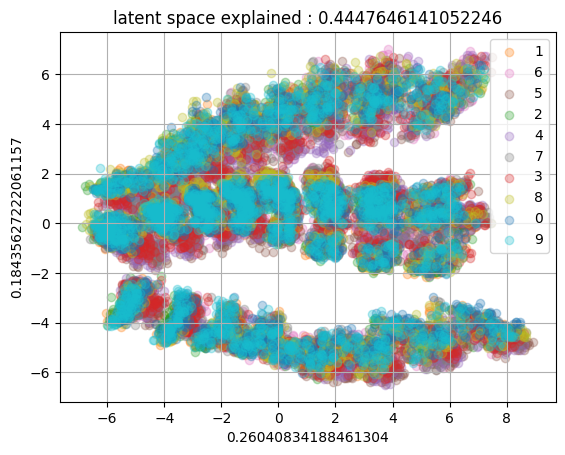

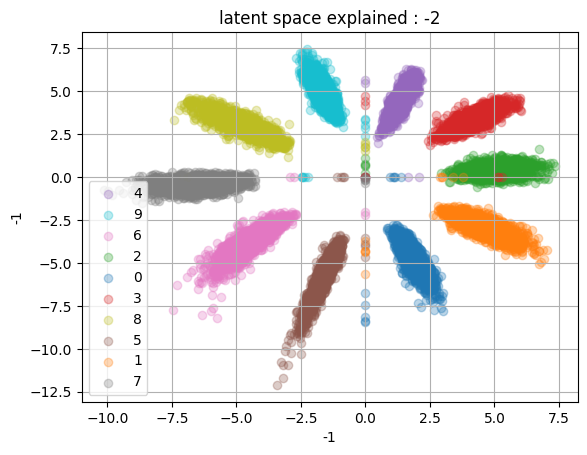

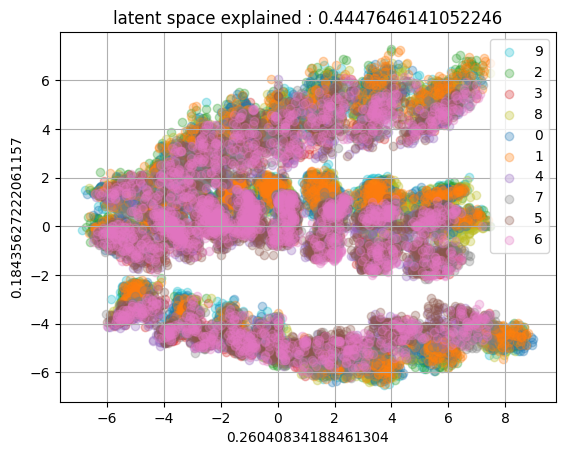

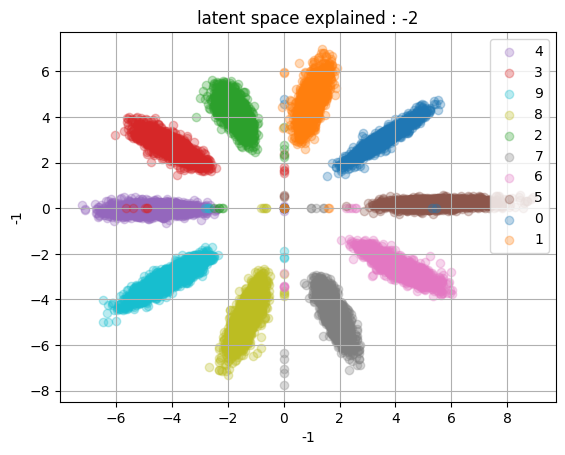

Epoch 2: 100%|██████████| 9600/9600 [09:05<00:00, 17.58it/s, v_num=9]

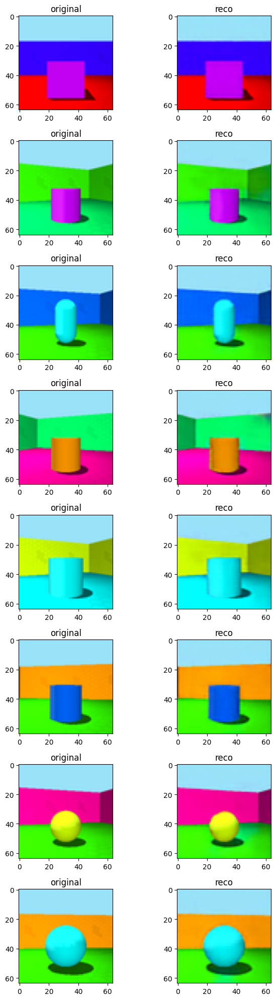

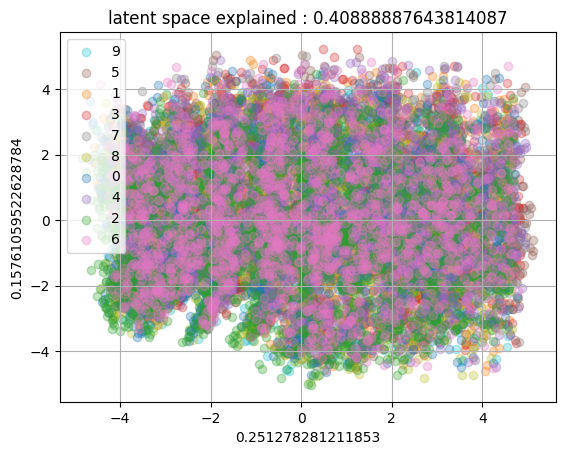

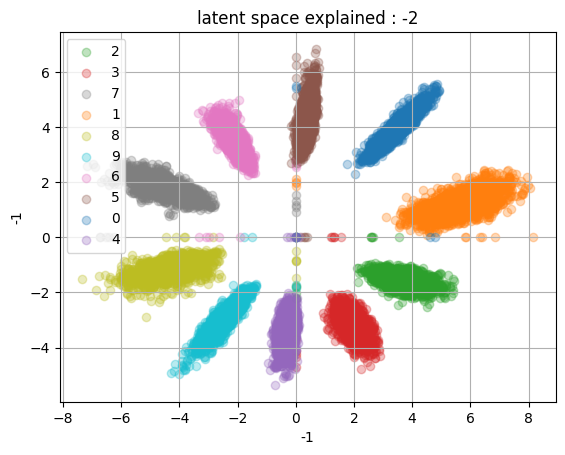

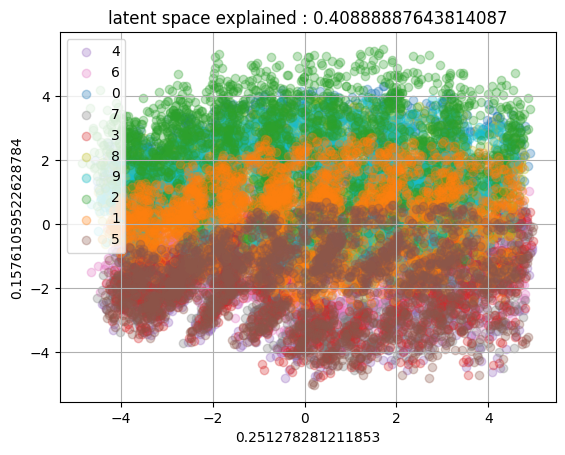

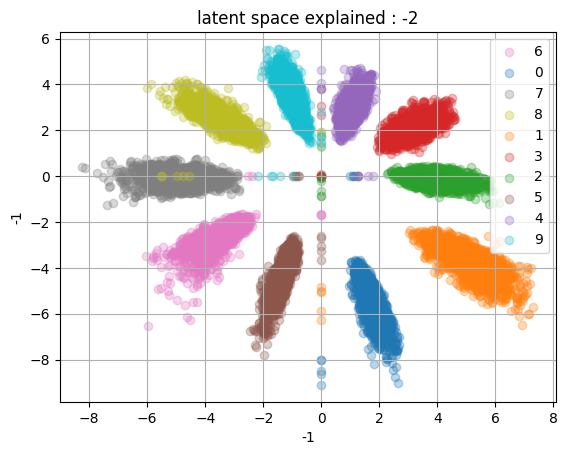

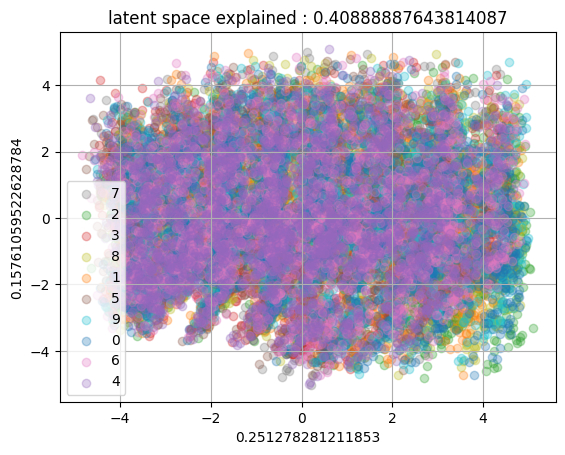

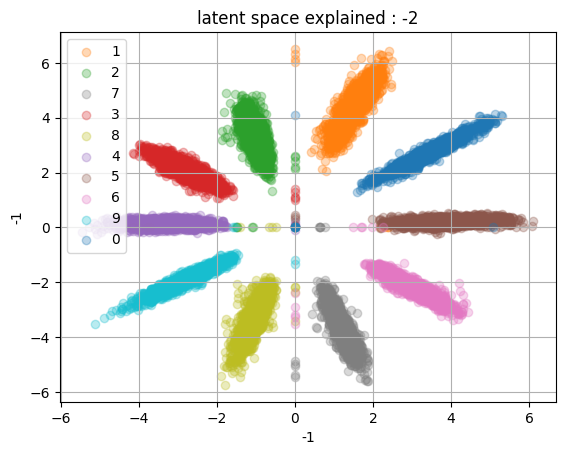

Epoch 4: 100%|██████████| 9600/9600 [09:04<00:00, 17.64it/s, v_num=9]

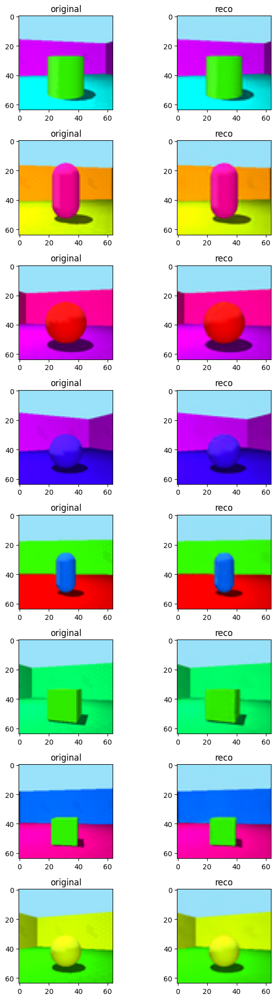

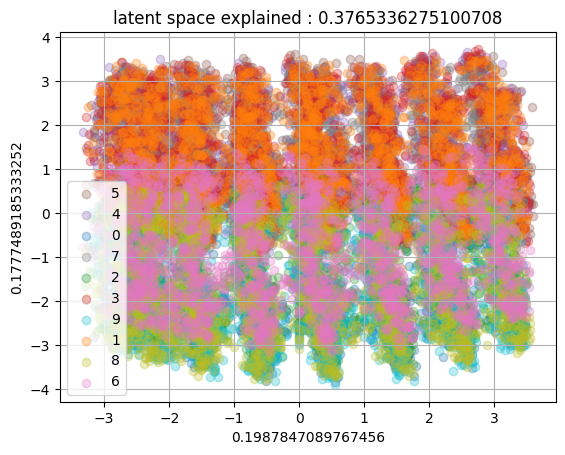

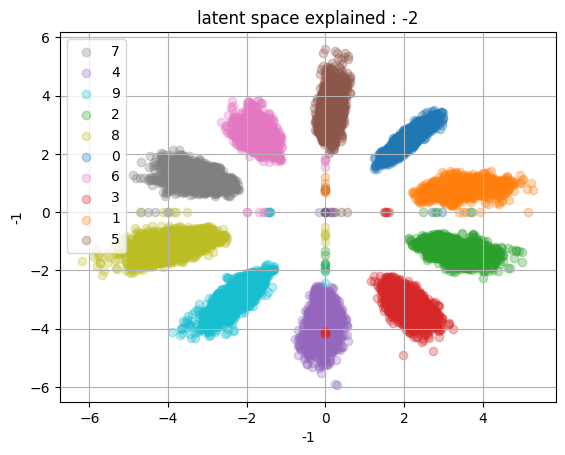

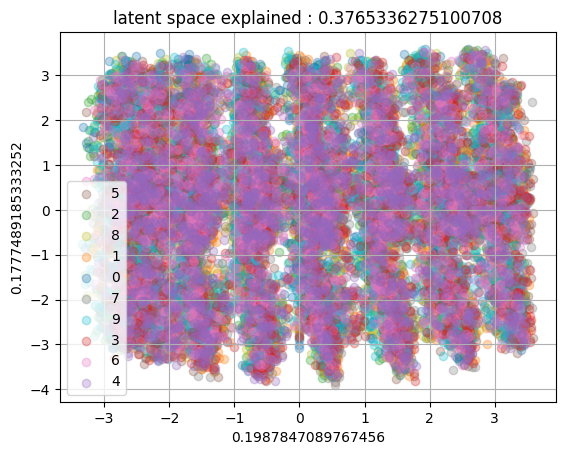

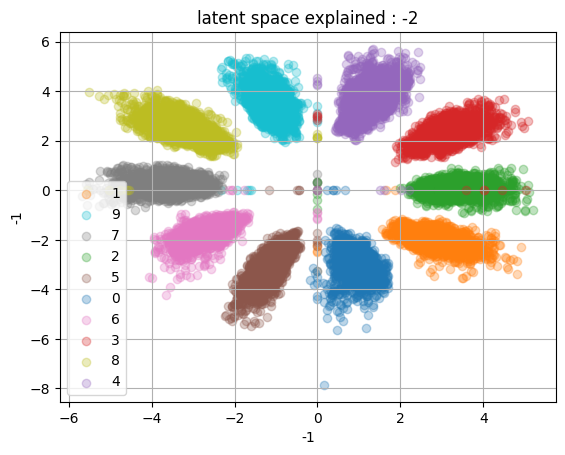

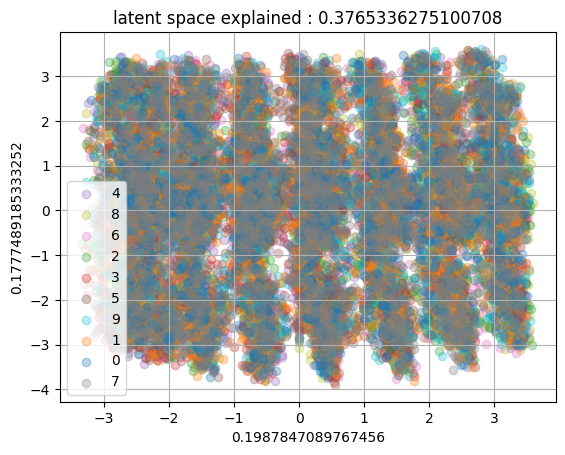

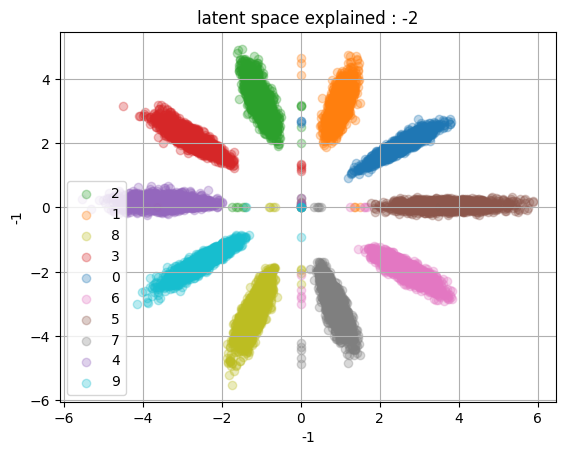

Epoch 6: 100%|██████████| 9600/9600 [09:47<00:00, 16.35it/s, v_num=9]

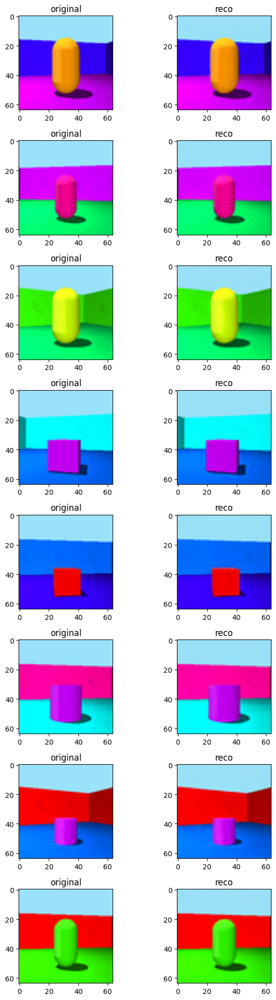

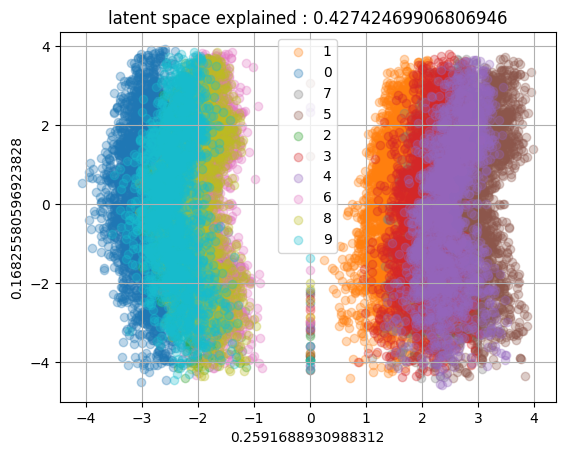

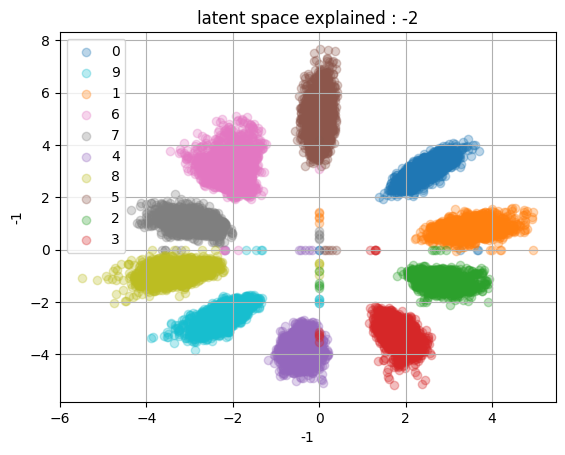

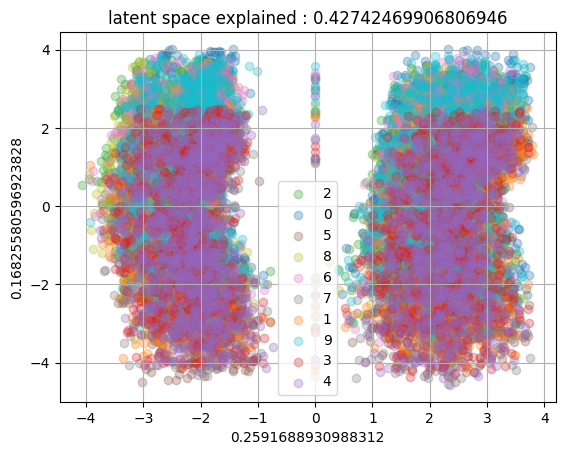

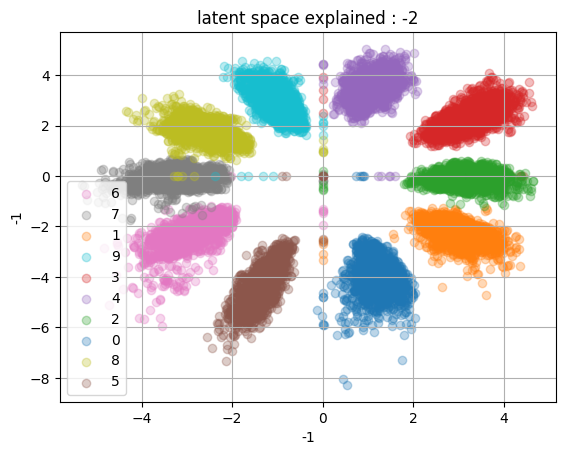

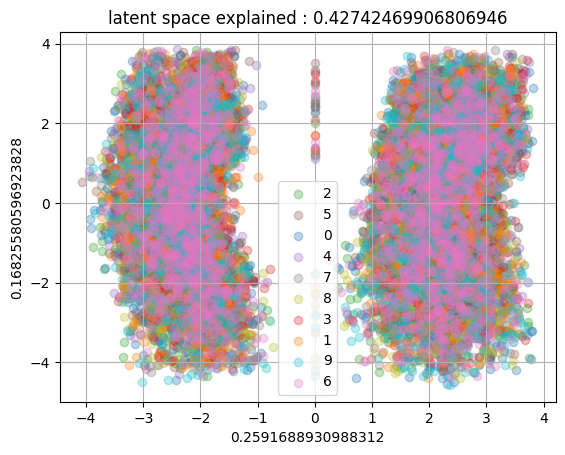

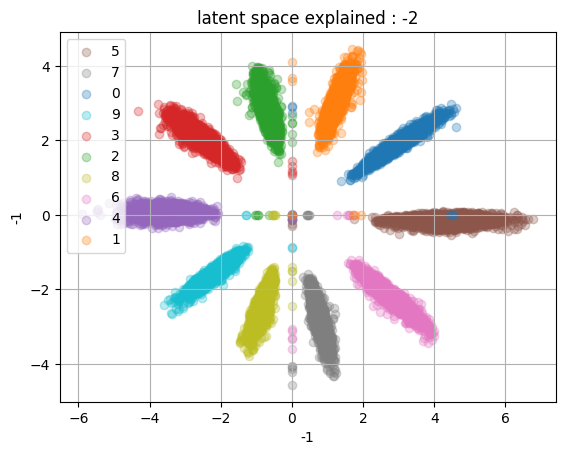

Epoch 8: 100%|██████████| 9600/9600 [09:11<00:00, 17.40it/s, v_num=9]

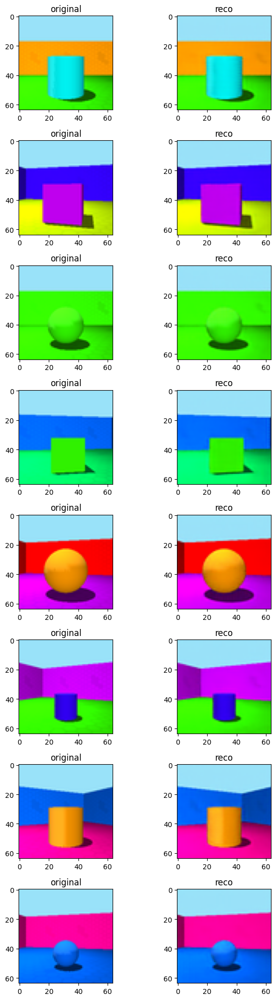

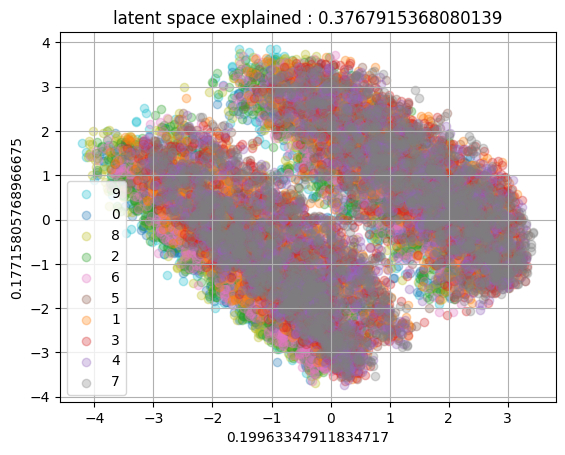

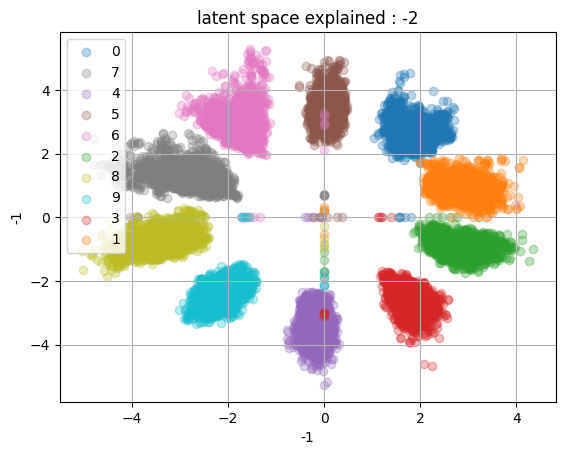

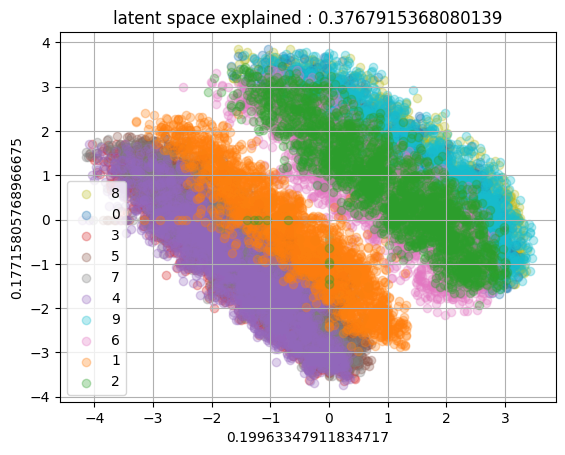

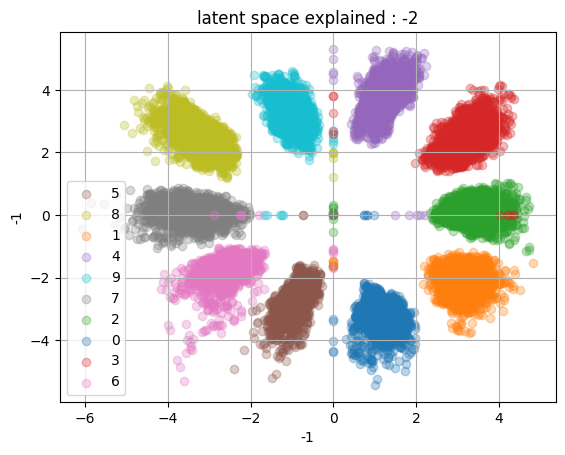

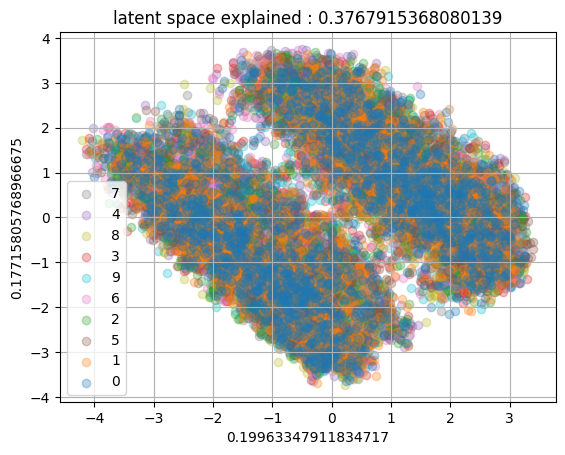

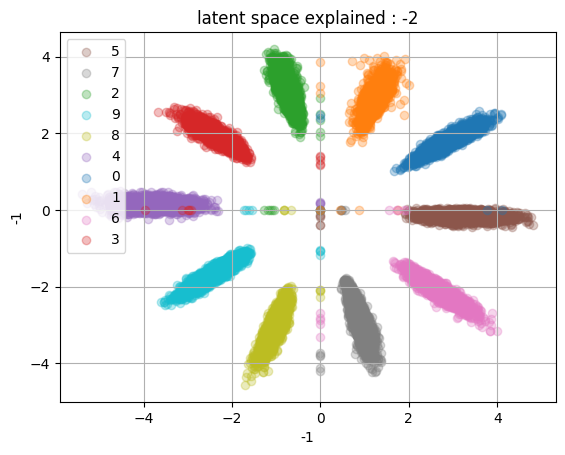

Epoch 9: 100%|██████████| 9600/9600 [09:05<00:00, 17.59it/s, v_num=9]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 9: 100%|██████████| 9600/9600 [09:06<00:00, 17.58it/s, v_num=9]


In [15]:
trainer.fit(xfactor, shapes_loader)

In [ ]:
xfactor = Xfactors.load_from_checkpoit("/projects/compures/alexandre/disdiff_adapters/lightning_logs/version_5/checkpoints/epoch=4-step=48000.ckpt")

In [10]:
len(xfactor.latent_train_buff["t"])

0

In [ ]:
xfactor.generate_cond(cond="s",)